In [1]:
import torch
from torch import nn
import torch.nn.functional as F
import torch.autograd as autograd
import torch.utils.data

import matplotlib.pyplot as pp
%matplotlib inline

from tqdm import tqdm_notebook as tqdm

from copy import deepcopy

In [2]:
dim = 1000
radius = 2
x_ = torch.cat(
    (
        torch.linspace(start=-2 * radius, end=2 * radius, steps=dim).unsqueeze(1).unsqueeze(1).repeat(1, dim, 1),
        torch.linspace(start=-2 * radius, end=2 * radius, steps=dim).unsqueeze(1).unsqueeze(1).repeat(1, dim, 1).transpose(0, 1)
    ), dim=2
)
y_ = (
    torch.lt(torch.norm(x_, p=2, dim=2), 1).float() + 
    torch.gt(torch.norm(x_, p=2, dim=2), 2).float()
)

In [3]:
def upload(x):
        return x.cuda()

class CircleDataset(torch.utils.data.Dataset):
    def __init__(self, size):
        self.size = size

    def __len__(self):
        return self.size

    def __getitem__(self, idx):
        x = torch.rand(2) * 4 * radius - 2 * radius
        y = (
            torch.lt(torch.norm(x, p=2, dim=0, keepdim=True), 1).float() + 
            torch.gt(torch.norm(x, p=2, dim=0, keepdim=True), 2).float()
        )
        x_reg = torch.rand(16, 2) * 4 * radius - 2 * radius
        return x, y, x_reg

dataloader = torch.utils.data.DataLoader(
    dataset=CircleDataset(size=2 ** 20), batch_size=64, shuffle=False
)

In [4]:
def gradient_norm(f, x):
    gradients = autograd.grad(
        outputs=f(x.requires_grad_(True)),
        inputs=x.requires_grad_(True),
        grad_outputs=torch.ones_like(f(x.requires_grad_(True))),
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    gradient_norm = torch.norm(gradients, p=2, dim=1, keepdim=True)
    return gradient_norm

def visualize(x, vmin, vmax):
    print(f"visualize range [{x.min().item()}, {x.max().item()}] mean {x.mean().item()}")
    pp.figure(num=None, figsize=(12, 12), dpi=80)
    fig = pp.imshow(
        x, cmap='hot', interpolation='nearest', 
        extent=(-2 * radius, 2 * radius, -2 * radius, 2 * radius), vmin=vmin, vmax=vmax
    )
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    pp.show()

def visualize_map(f):
    visualize(
        f(x_.view(dim**2, 2).cuda()).detach().cpu().view(dim, dim).flip(0),
        vmin=0, vmax=1
    )

def visualize_error(f):
    visualize(
        torch.abs(f(x_.view(dim**2, 2).cuda()).detach().cpu().view(dim, dim) - y_).flip(0),
        vmin=0, vmax=1
    )

def visualize_gradients(f):
    visualize(
        gradient_norm(f=f, x=x_.view(dim**2, 2).cuda()).detach().cpu().view(dim, dim).flip(0),
        vmin=0, vmax=1
    )

visualize range [0.0, 1.0] mean 0.8530200123786926


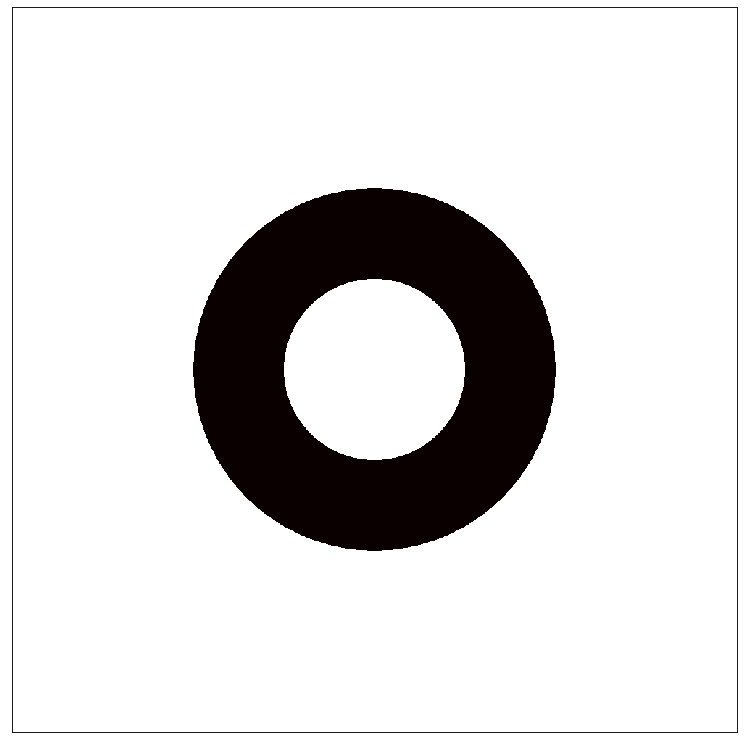

In [5]:
visualize(y_, vmin=0, vmax=1)

visualize range [5.412101745605469e-05, 1.0] mean 0.8530321717262268


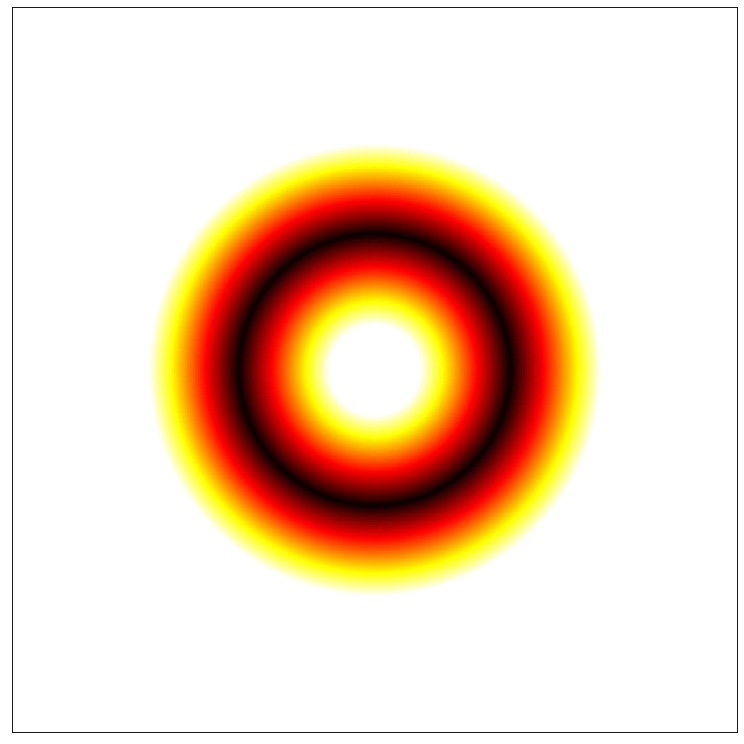

In [6]:
y_opt = (
    torch.lt(torch.norm(x_, p=2, dim=2), 0.5).float() * 1 + 
    torch.gt(torch.norm(x_, p=2, dim=2), 0.5).float() *
    torch.lt(torch.norm(x_, p=2, dim=2), 1.5).float() * 
        (1.5 - torch.norm(x_, p=2, dim=2)) + 
    torch.gt(torch.norm(x_, p=2, dim=2), 1.5).float() *
    torch.lt(torch.norm(x_, p=2, dim=2), 2.5).float() * 
        (-1.5 + torch.norm(x_, p=2, dim=2)) + 
    torch.gt(torch.norm(x_, p=2, dim=2), 2.5).float() * 1
)

visualize(y_opt, vmin=0, vmax=1)

visualize range [0.0, 0.49997687339782715] mean 0.07348400354385376


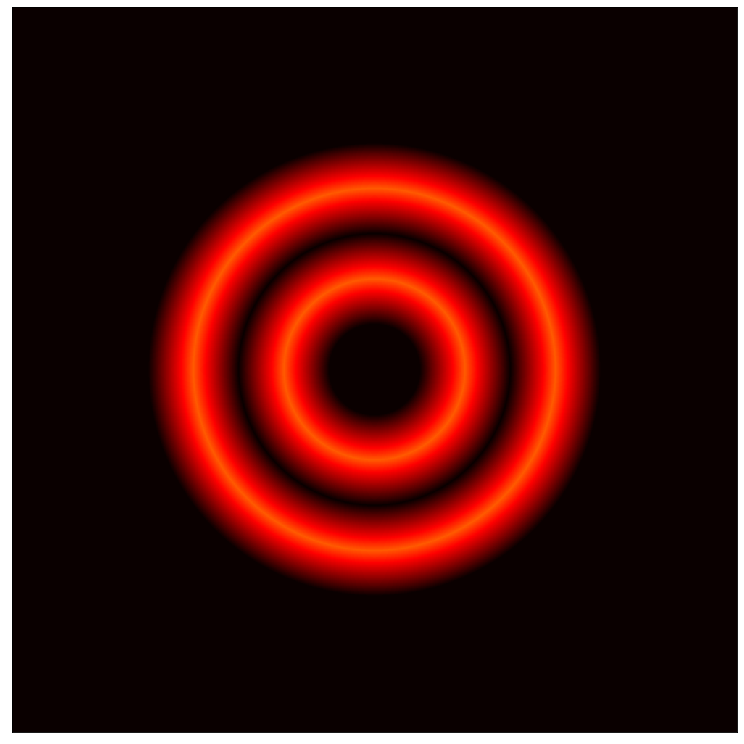

In [7]:
y_opt_error = torch.abs(y_ - y_opt)

visualize(y_opt_error, vmin=0, vmax=1)

visualize range [0.0, 1.0] mean 0.293971985578537


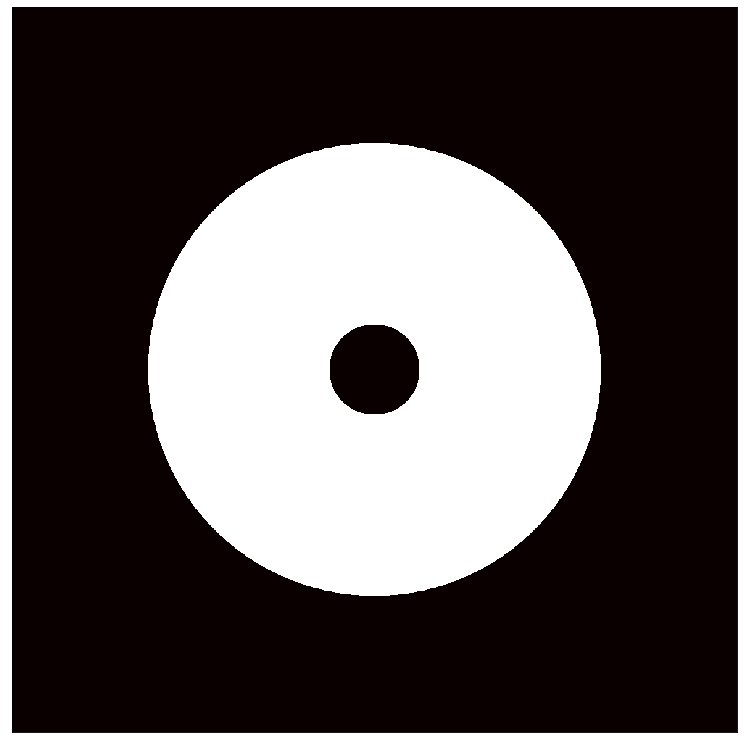

In [8]:
y_opt_gradient = (
    torch.lt(torch.norm(x_, p=2, dim=2), 0.5).float() * 0 + 
    torch.gt(torch.norm(x_, p=2, dim=2), 0.5).float() *
    torch.lt(torch.norm(x_, p=2, dim=2), 2.5).float() * 1 + 
    torch.gt(torch.norm(x_, p=2, dim=2), 2.5).float() * 0
)

visualize(y_opt_gradient, vmin=0, vmax=1)

In [9]:
def visualize_gradient_error(f):
    visualize(
        torch.abs(
            gradient_norm(f=f, x=x_.view(dim**2, 2).cuda()).detach().cpu().view(dim, dim) - 
            y_opt_gradient
        ).flip(0),
        vmin=0, vmax=1
    )

In [10]:
# base
f_base = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_base.parameters())

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)
    optimizer.zero_grad()
    y_hat = f_base(x)
    loss = F.mse_loss(y_hat, y)
    loss.backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()}")


visualize range [2.980232238769531e-07, 0.9917422533035278] mean 0.1917106658220291


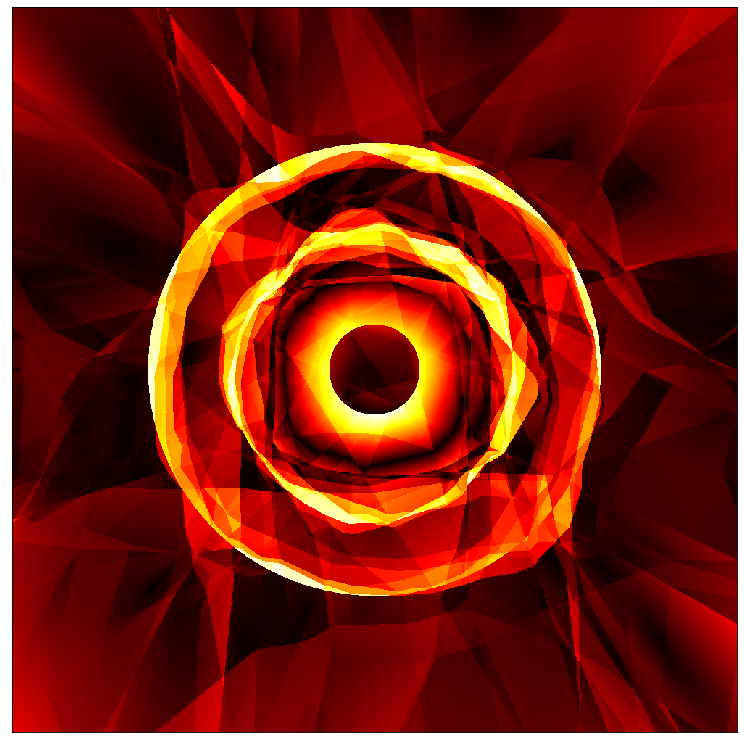

In [11]:
visualize_gradient_error(f_base)

visualize range [0.0302618145942688, 1.2880702018737793] mean 0.8738768100738525


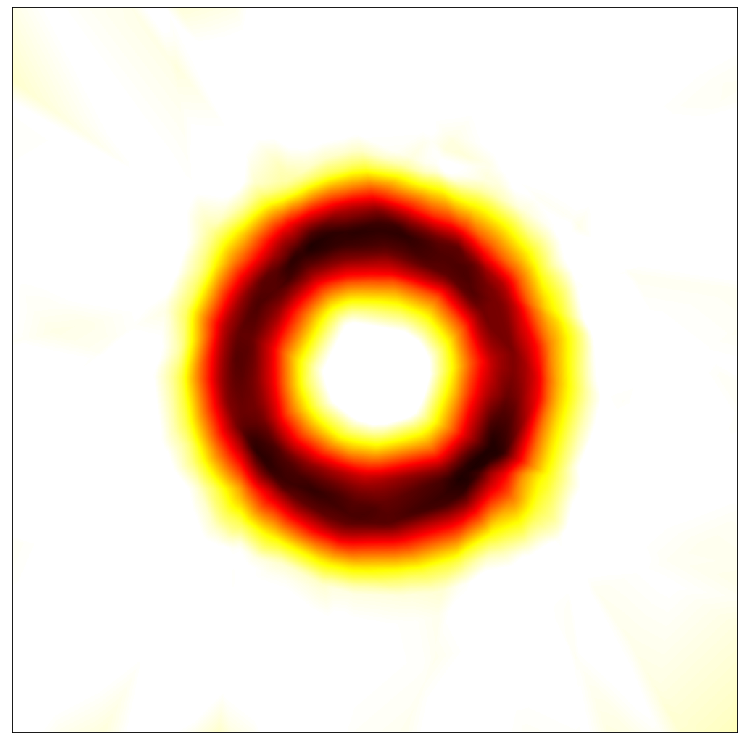

In [12]:
visualize_map(f_base)

visualize range [0.0, 0.6830199956893921] mean 0.08171754330396652


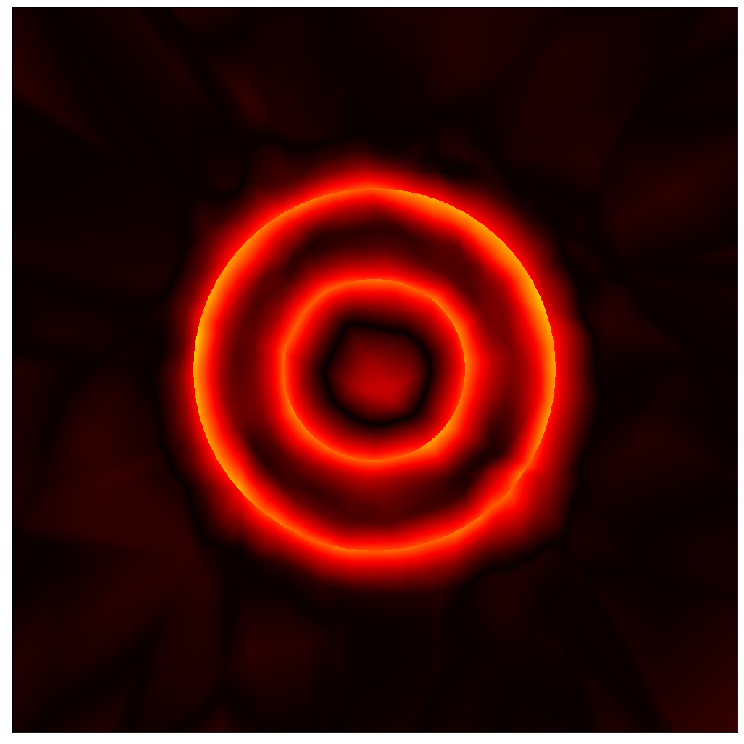

In [13]:
visualize_error(f_base)

visualize range [0.00016579529619775712, 1.5126456022262573] mean 0.27735012769699097


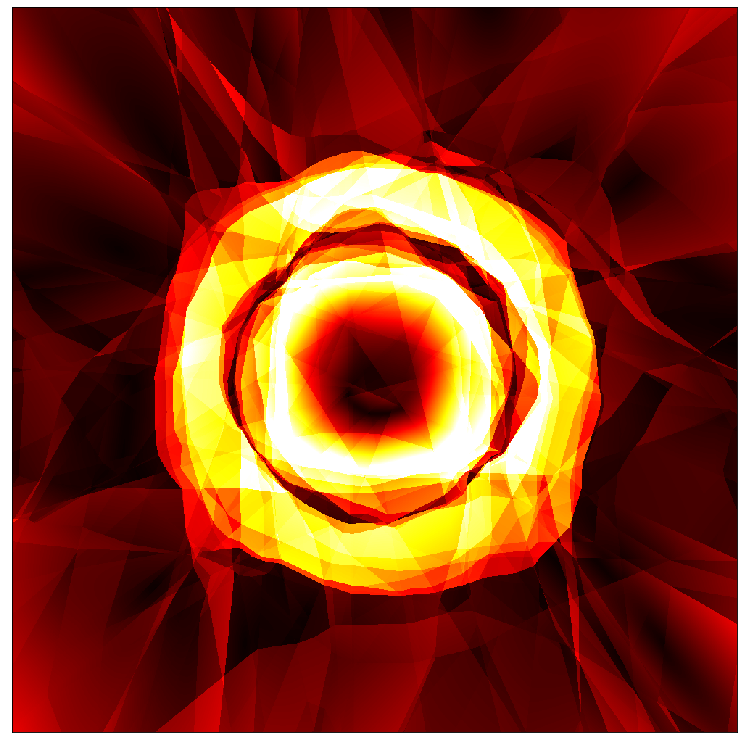

In [14]:
visualize_gradients(f_base)

In [15]:
# SN
f_sn = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_sn.parameters())

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)
    optimizer.zero_grad()
    y_hat = f_sn(x)
    loss = F.mse_loss(y_hat, y)
    loss.backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()}")


visualize range [7.152557373046875e-06, 0.9993894100189209] mean 0.2082975059747696


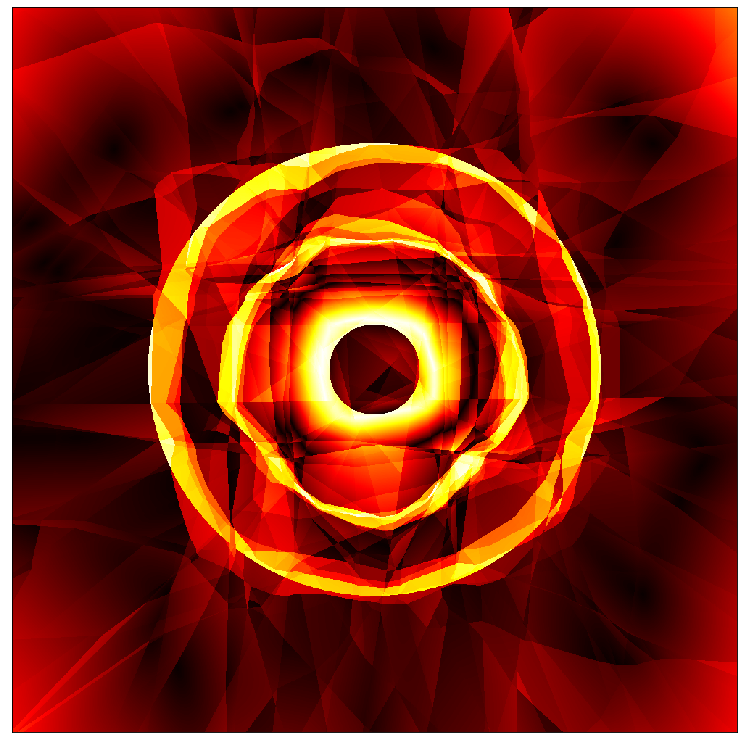

In [16]:
visualize_gradient_error(f_sn)

visualize range [-0.031177636235952377, 1.0978361368179321] mean 0.8683895468711853


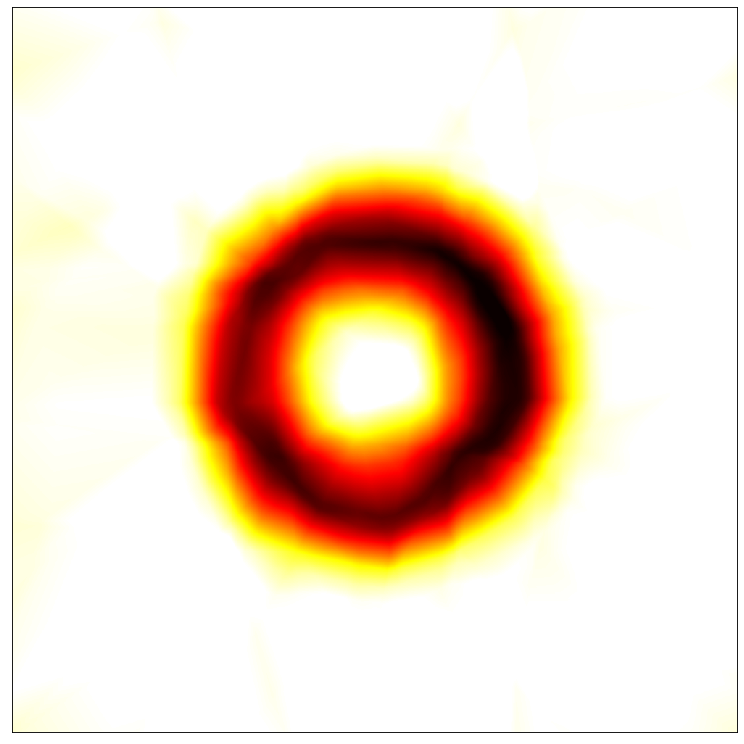

In [17]:
visualize_map(f_sn)

visualize range [1.1920928955078125e-07, 0.7173206210136414] mean 0.0834088996052742


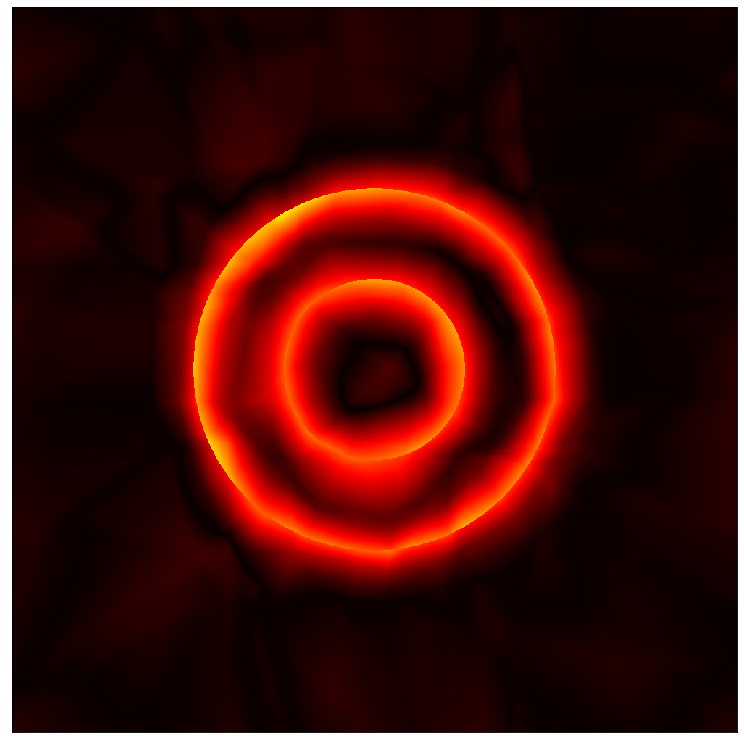

In [18]:
visualize_error(f_sn)

visualize range [0.00015779030218254775, 1.829634666442871] mean 0.2673962414264679


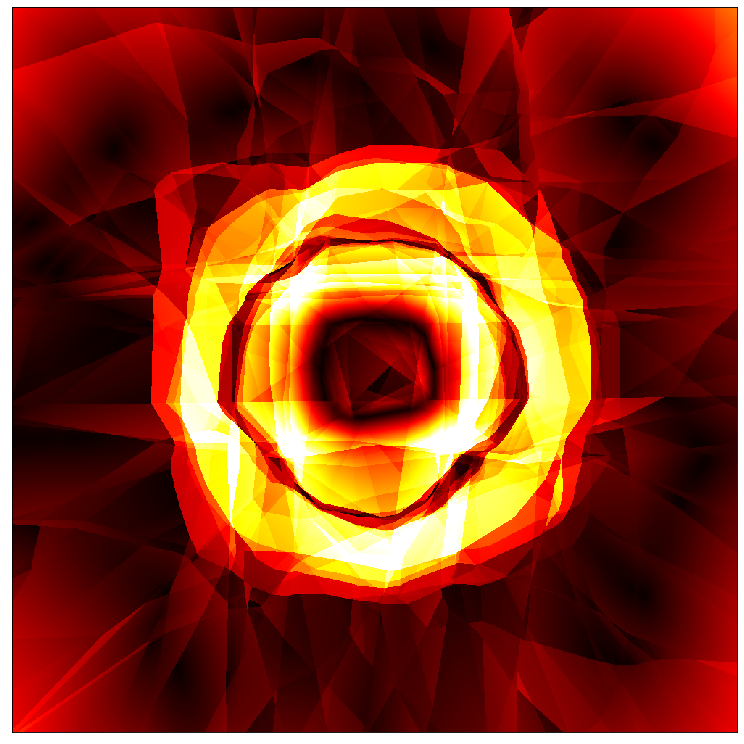

In [19]:
visualize_gradients(f_sn)

In [20]:
# LP \lambda 0.1
f_lp_l01 = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_lp_l01.parameters())

lambda_lp = 0.1

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)
    optimizer.zero_grad()
    
    gradient_penalty = lambda_lp * (torch.clamp(gradient_norm(f=f_lp_l01, x=x_reg) - 1, min=0) ** 2).mean()
    
    y_hat = f_lp_l01(x)
    loss = F.mse_loss(y_hat, y)
    (loss + gradient_penalty).backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()}")
    

visualize range [4.76837158203125e-07, 0.9995430707931519] mean 0.22183844447135925


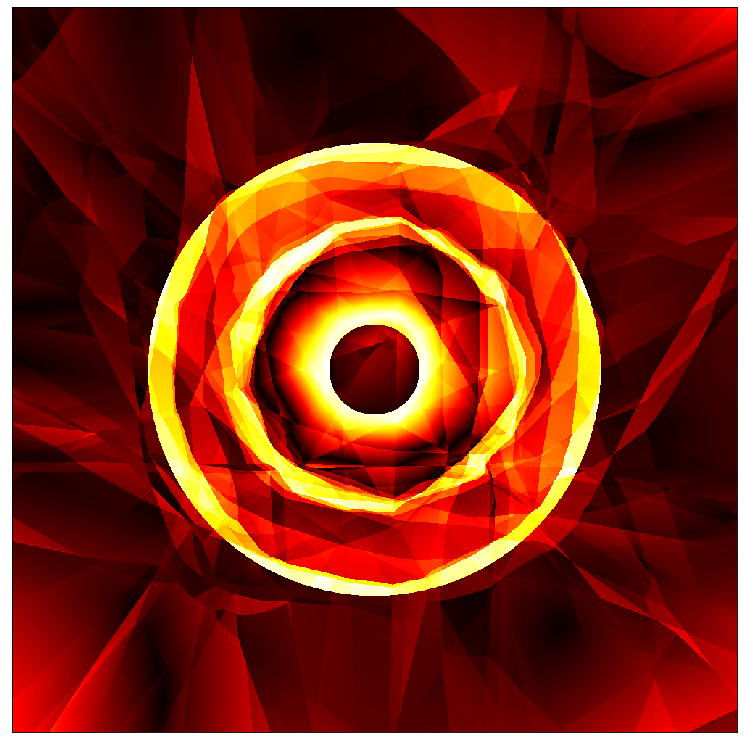

In [21]:
visualize_gradient_error(f_lp_l01)

visualize range [-0.021802425384521484, 1.1106457710266113] mean 0.8568161129951477


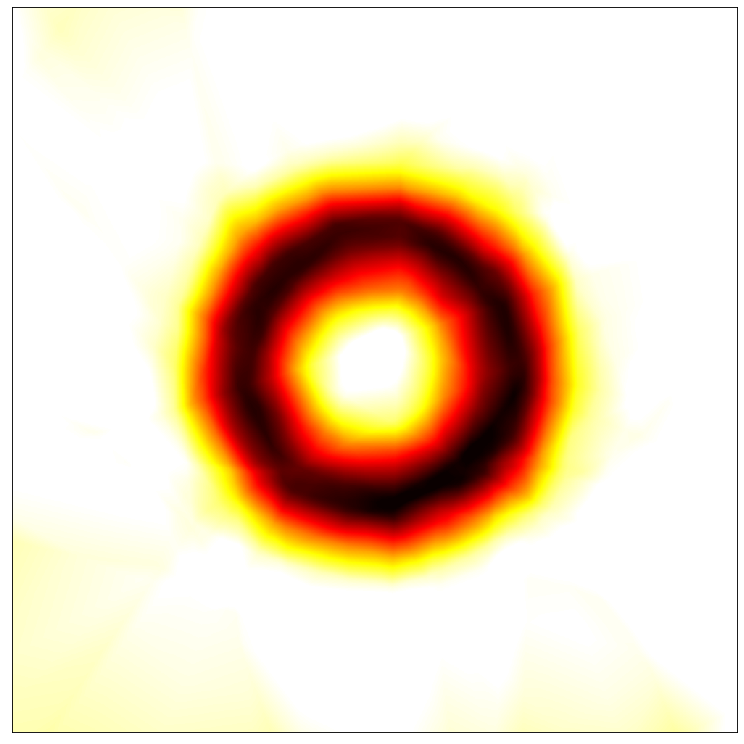

In [22]:
visualize_map(f_lp_l01)

visualize range [0.0, 0.7183429002761841] mean 0.08733134716749191


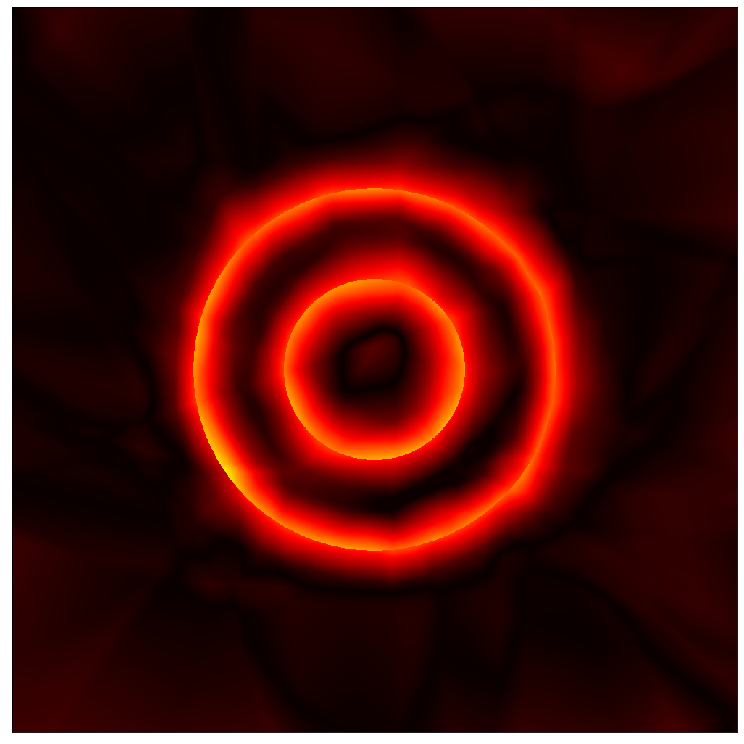

In [23]:
visualize_error(f_lp_l01)

visualize range [0.000216819898923859, 1.5071746110916138] mean 0.23148460686206818


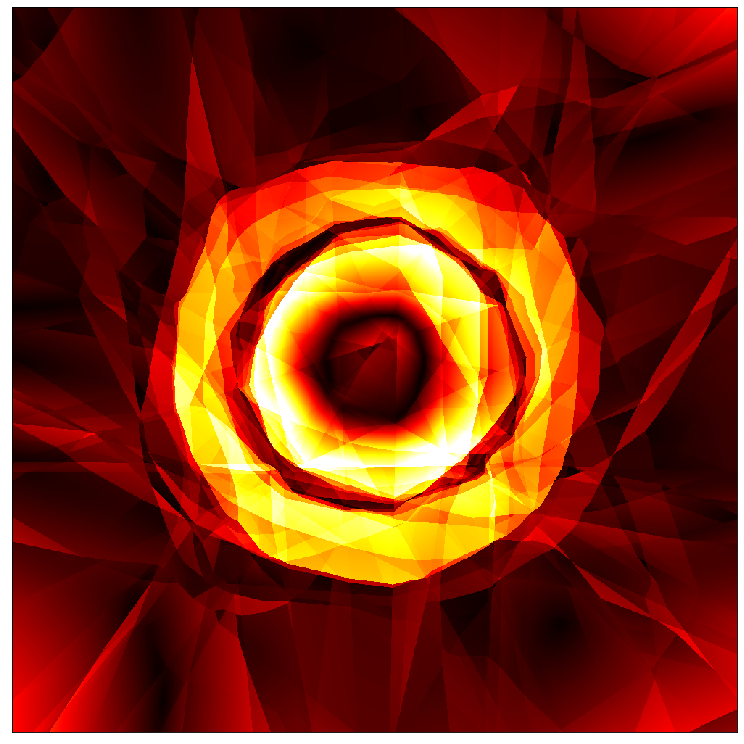

In [24]:
visualize_gradients(f_lp_l01)

In [25]:
# LP \lambda 1
f_lp_l1 = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_lp_l1.parameters())

lambda_lp = 1

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)
    optimizer.zero_grad()
    
    gradient_penalty = lambda_lp * (torch.clamp(gradient_norm(f=f_lp_l1, x=x_reg) - 1, min=0) ** 2).mean()
    
    y_hat = f_lp_l1(x)
    loss = F.mse_loss(y_hat, y)
    (loss + gradient_penalty).backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()}")
    

visualize range [5.960464477539062e-07, 0.9994359016418457] mean 0.20339219272136688


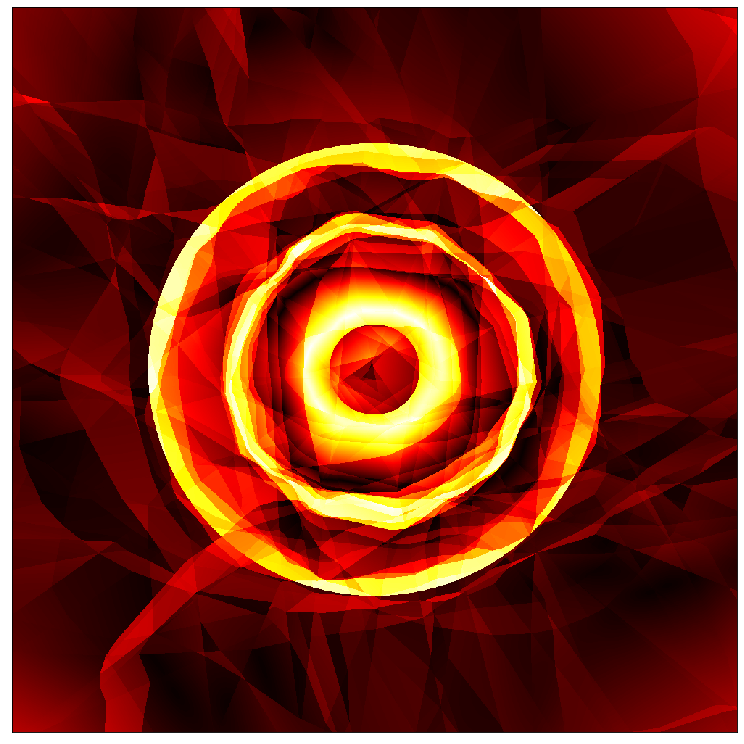

In [26]:
visualize_gradient_error(f_lp_l1)

visualize range [-0.03324407339096069, 1.2525346279144287] mean 0.8473051190376282


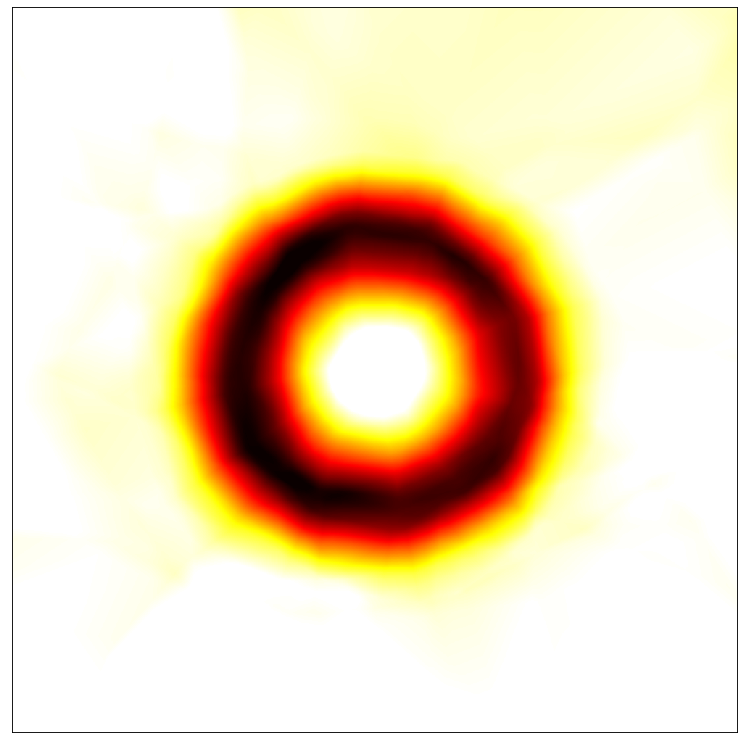

In [27]:
visualize_map(f_lp_l1)

visualize range [0.0, 0.6013197898864746] mean 0.08754906058311462


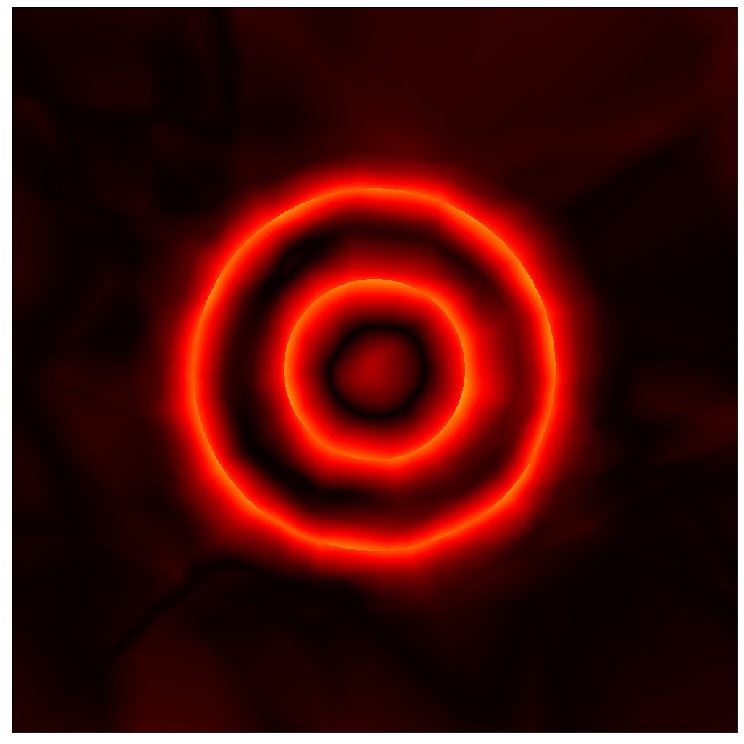

In [28]:
visualize_error(f_lp_l1)

visualize range [5.2265735575929284e-05, 1.2449029684066772] mean 0.23617009818553925


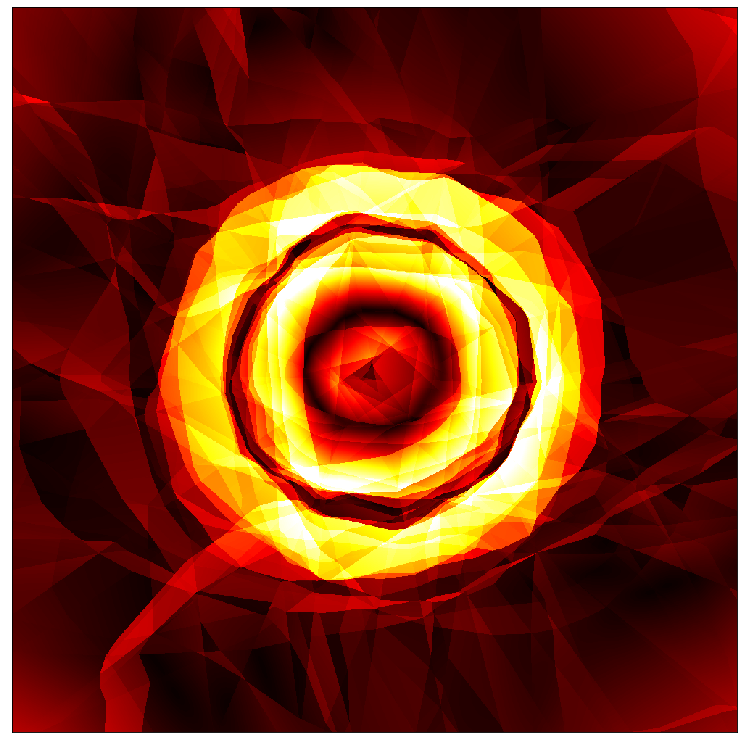

In [29]:
visualize_gradients(f_lp_l1)

In [30]:
# LP \lambda 10
f_lp_l10 = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_lp_l10.parameters())

lambda_lp = 10

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)
    optimizer.zero_grad()
    
    gradient_penalty = lambda_lp * (torch.clamp(gradient_norm(f=f_lp_l10, x=x_reg) - 1, min=0) ** 2).mean()
    
    y_hat = f_lp_l10(x)
    loss = F.mse_loss(y_hat, y)
    (loss + gradient_penalty).backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()}")
    

visualize range [2.181529998779297e-05, 0.9985711574554443] mean 0.22157032787799835


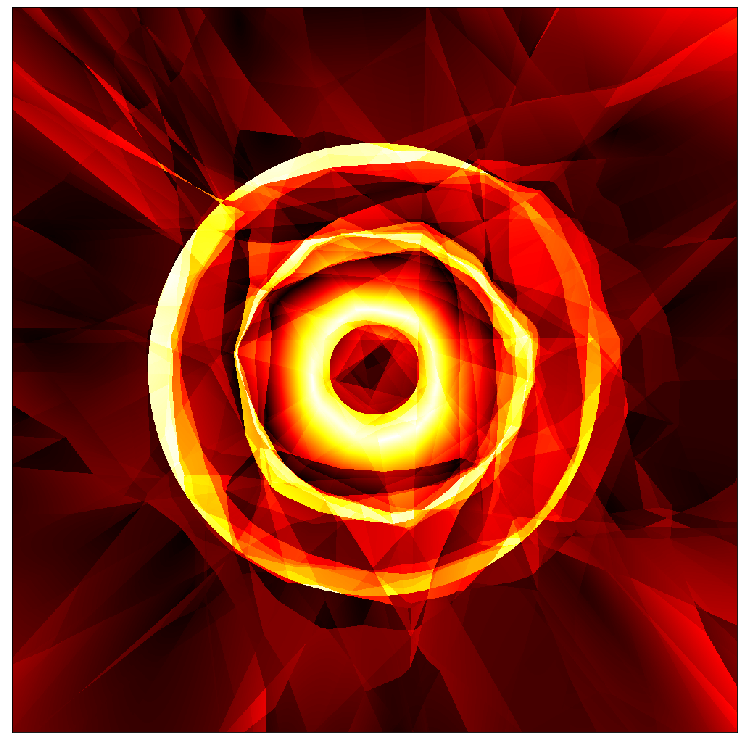

In [31]:
visualize_gradient_error(f_lp_l10)

visualize range [-0.009119614958763123, 1.1811994314193726] mean 0.8631041049957275


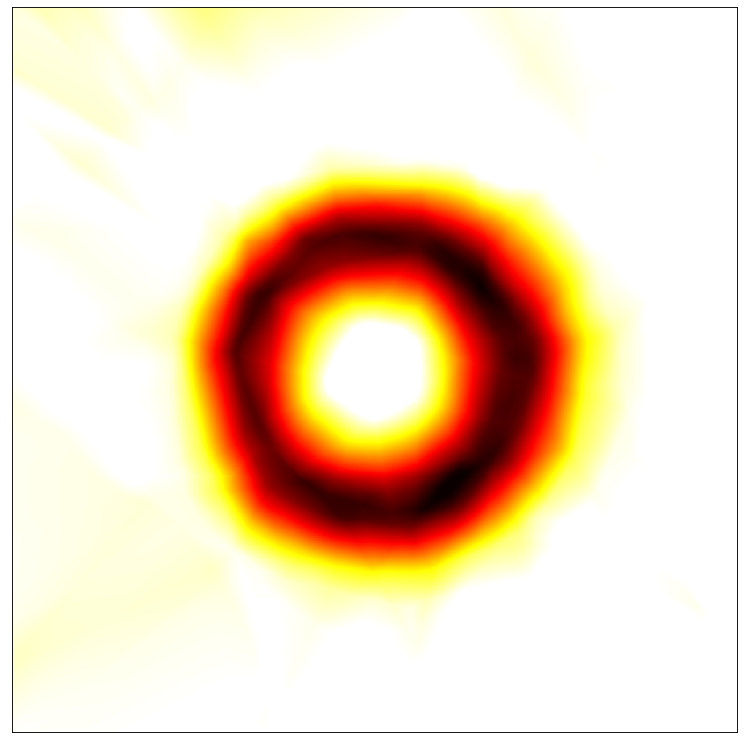

In [32]:
visualize_map(f_lp_l10)

visualize range [0.0, 0.7514914274215698] mean 0.09030628949403763


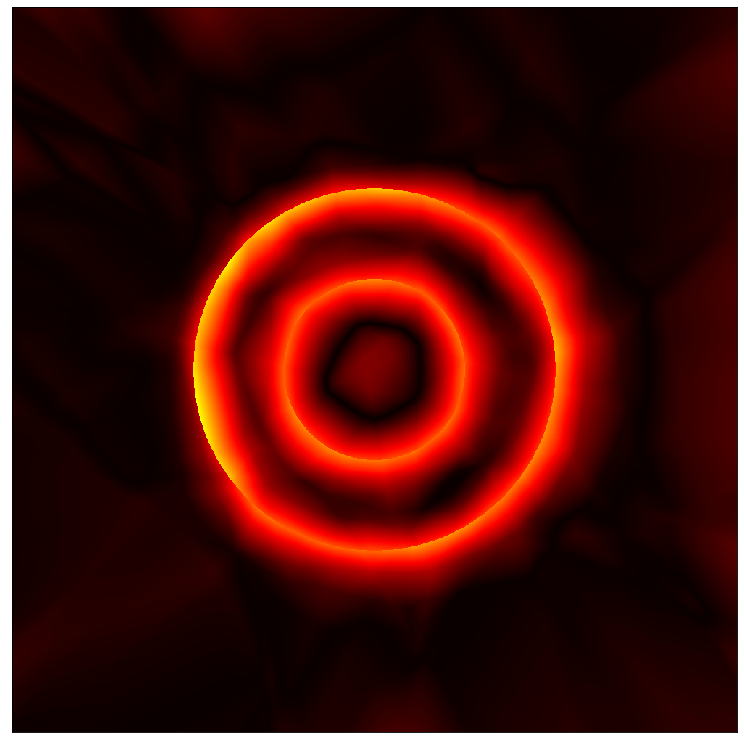

In [33]:
visualize_error(f_lp_l10)

visualize range [0.00027917453553527594, 1.188712477684021] mean 0.24574288725852966


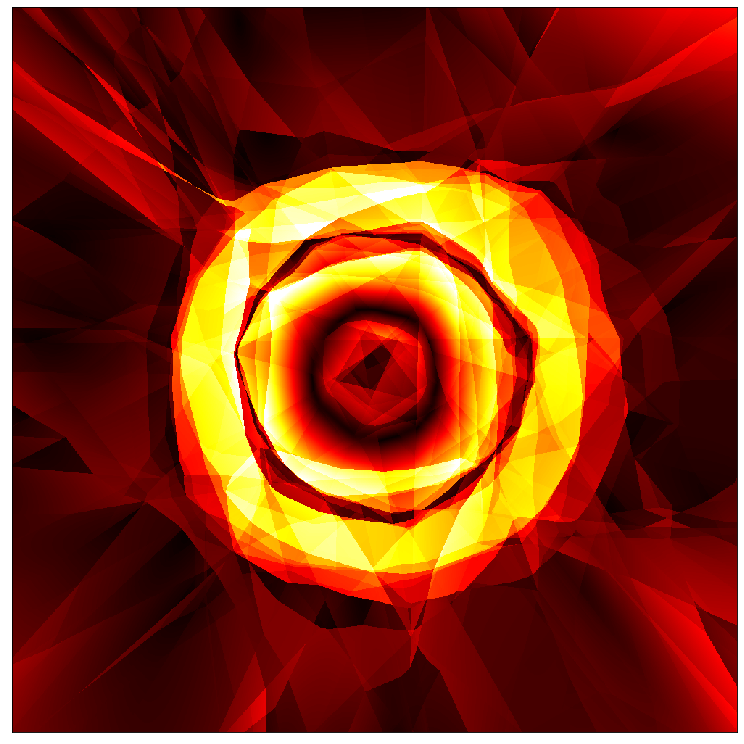

In [34]:
visualize_gradients(f_lp_l10)

In [17]:
class ALR(object):
    def __init__(self, d_X, d_Y, eps_min, eps_max, xi, ip, K):
        super(ALR, self).__init__()
        self.d_X = d_X
        self.d_Y = d_Y
        self.eps_min = eps_min
        self.eps_max = eps_max
        if eps_min == eps_max:
            self.eps = lambda x: eps_min * torch.ones(x.size(0), 1, device=x.device)
        else:
            self.eps = lambda x: torch.distributions.uniform.Uniform(
                low=eps_min, high=eps_max
            ).sample(
                sample_shape=(x.size(0), 1)
            ).cuda()
        self.xi = xi
        self.ip = ip
        self.K = K
    
    def adversarial_direction(self, f, x):
        batch_size = x.size(0)
        y = f(x).detach()
        f.zero_grad()
        normalize = lambda vector: F.normalize(vector, p=2, dim=1)
        d = torch.rand_like(x) - 0.5
        for _ in range(self.ip):
            d = normalize(d)
            d.requires_grad_()
            x_hat = x + self.xi * d
            y_hat = f(x_hat)
            y_diff = self.d_Y(y, y_hat)
            y_diff = torch.mean(y_diff)
            y_diff.backward()
            d = d.grad.detach()
            f.zero_grad()
        r_adv = normalize(d) * self.eps(x)
        # remove too small values
        r_adv_mask = torch.lt(torch.norm(r_adv, p=2, dim=1, keepdim=True), self.eps_min).float()
        r_adv = (1 - r_adv_mask) * r_adv + r_adv_mask * normalize(torch.rand_like(x) - 0.5)
        f.zero_grad()
        return r_adv
        
    def get_adversarial_perturbations(self, f, x):
        r_adv = self.adversarial_direction(f=f, x=x.detach())
        x_hat = x + r_adv
        return x_hat

    def get_alp(self, x, x_hat, y, y_hat):
        y_diff = self.d_Y(y, y_hat)
        x_diff = self.d_X(x, x_hat)
        lip_ratio = y_diff / x_diff
        alp = torch.clamp(lip_ratio - self.K, min=0)
        nonzeros = torch.nonzero(alp)
        alp_count = nonzeros.size(0)
        return (
            alp, lip_ratio, x_diff, y_diff, alp_count
        )

In [18]:
# ALP \lambda 01 ip 0
f_alp_l01_ip0 = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_alp_l01_ip0.parameters())

alr = ALR(
    d_X=lambda x, x_hat: torch.norm(x - x_hat, p=2, dim=1, keepdim=True), 
    d_Y=lambda y, y_hat: torch.abs(y - y_hat), 
    eps_min=1e-6, 
    eps_max=1e-5,
    xi=1e-1, 
    ip=0, 
    K=1
)

lambda_alp = 0.1

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)

    optimizer.zero_grad()
    
    x_hat = alr.get_adversarial_perturbations(
        f=f_alp_l01_ip0, x=x_reg
    )
    
    y_hat = f_alp_l01_ip0(x)
    loss = F.mse_loss(y_hat, y)
    
    alp, lip_ratio, x_diff, y_diff, alp_count = alr.get_alp(
        x=x_reg, x_hat=x_hat, y=f_alp_l01_ip0(x_reg), y_hat=f_alp_l01_ip0(x_hat)
    )
    
    alp_loss = lambda_alp * (alp ** 2).mean()
    
    (loss + alp_loss).backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()} count={alp_count} lip={lip_ratio.max().item()}")
    

visualize range [7.315856782952324e-05, 0.9996441602706909] mean 0.2976723313331604


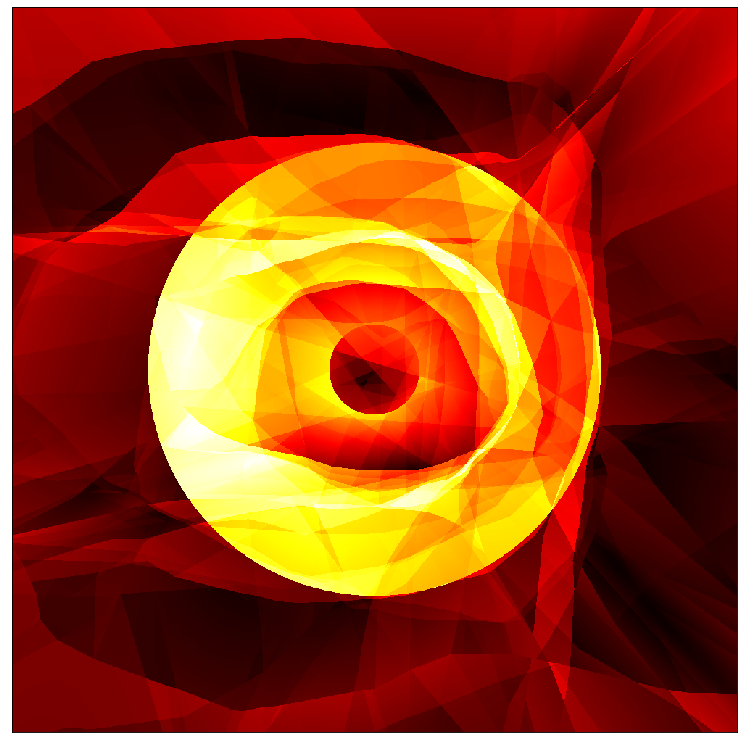

In [19]:
visualize_gradient_error(f_alp_l01_ip0)

visualize range [0.17312687635421753, 1.137113094329834] mean 0.8586820960044861


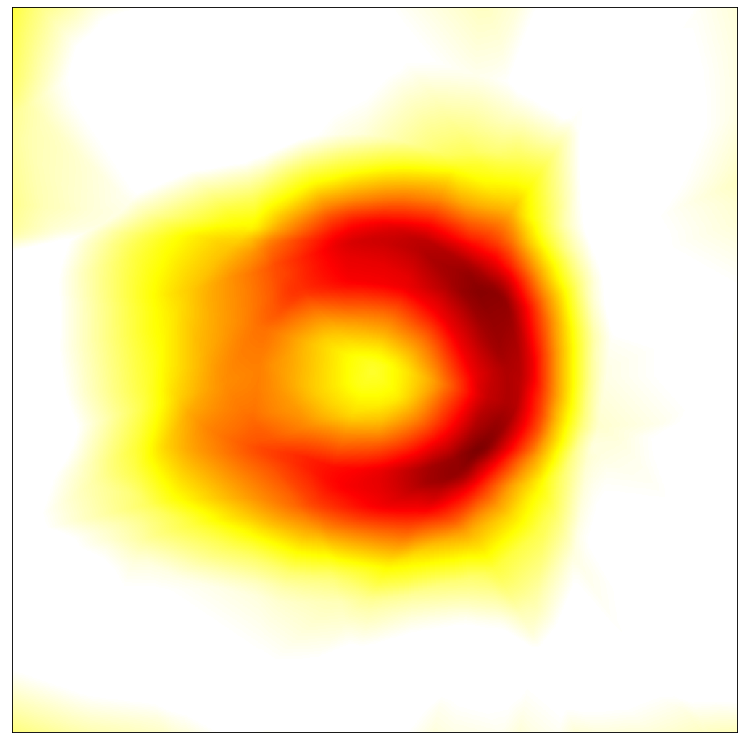

In [20]:
visualize_map(f_alp_l01_ip0)

visualize range [1.1920928955078125e-07, 0.6936973333358765] mean 0.14780956506729126


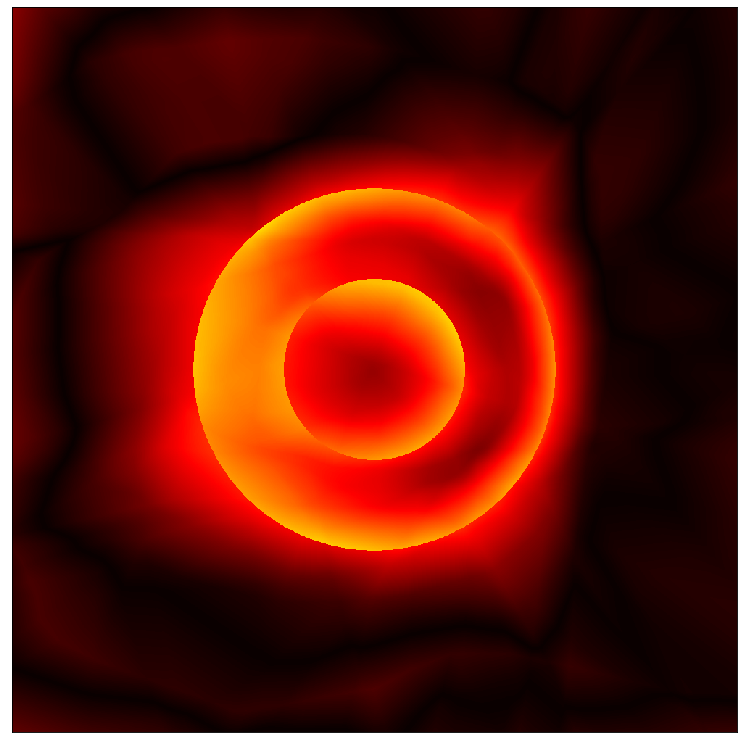

In [21]:
visualize_error(f_alp_l01_ip0)

visualize range [7.315856782952324e-05, 0.9923966526985168] mean 0.20779983699321747


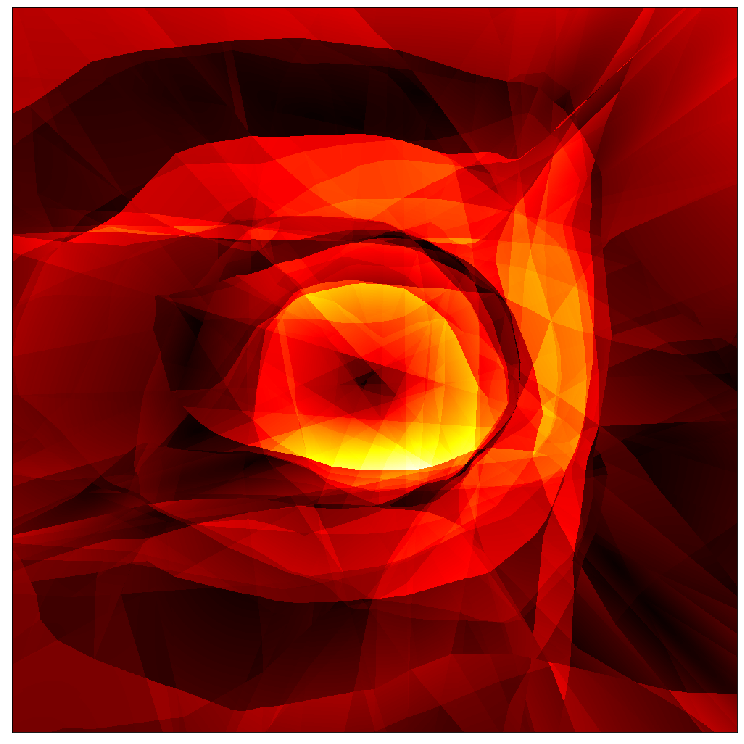

In [22]:
visualize_gradients(f_alp_l01_ip0)

In [23]:
# ALP \lambda 1 ip 0
f_alp_l1_ip0 = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_alp_l1_ip0.parameters())

alr = ALR(
    d_X=lambda x, x_hat: torch.norm(x - x_hat, p=2, dim=1, keepdim=True), 
    d_Y=lambda y, y_hat: torch.abs(y - y_hat), 
    eps_min=1e-6, 
    eps_max=1e-5,
    xi=1e-1, 
    ip=0, 
    K=1
)

lambda_alp = 1

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)

    optimizer.zero_grad()
    
    x_hat = alr.get_adversarial_perturbations(
        f=f_alp_l1_ip0, x=x_reg
    )
    
    y_hat = f_alp_l1_ip0(x)
    loss = F.mse_loss(y_hat, y)
    
    alp, lip_ratio, x_diff, y_diff, alp_count = alr.get_alp(
        x=x_reg, x_hat=x_hat, y=f_alp_l1_ip0(x_reg), y_hat=f_alp_l1_ip0(x_hat)
    )
    
    alp_loss = lambda_alp * (alp ** 2).mean()
    
    (loss + alp_loss).backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()} count={alp_count} lip={lip_ratio.max().item()}")
    

visualize range [2.384185791015625e-07, 0.99431312084198] mean 0.21008938550949097


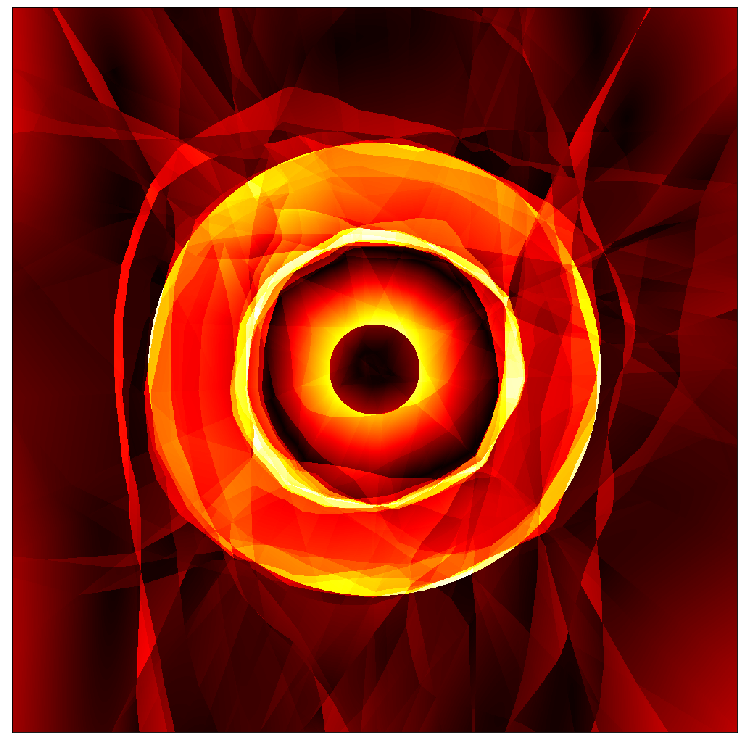

In [24]:
visualize_gradient_error(f_alp_l1_ip0)

visualize range [0.05397120118141174, 1.1414973735809326] mean 0.8539022207260132


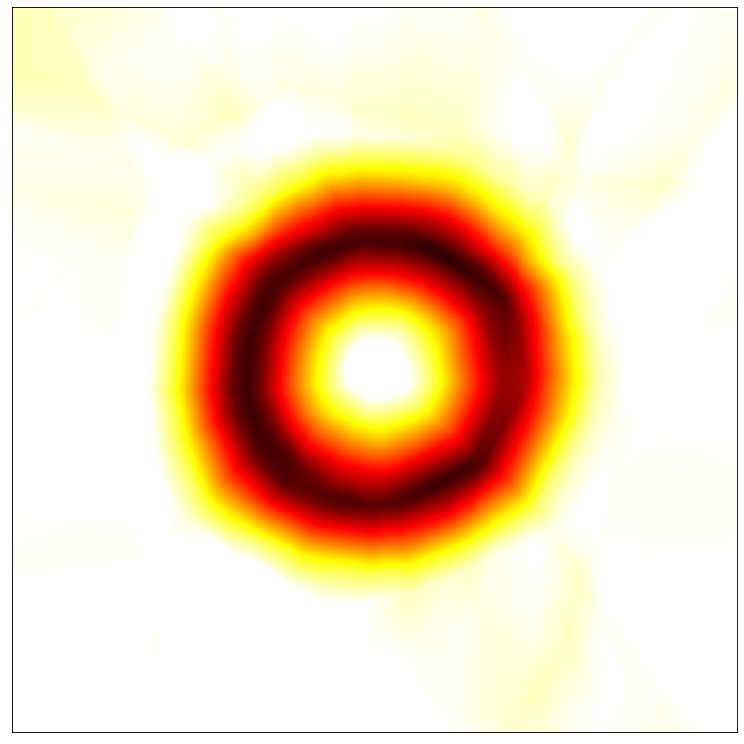

In [25]:
visualize_map(f_alp_l1_ip0)

visualize range [0.0, 0.6191962957382202] mean 0.09477642923593521


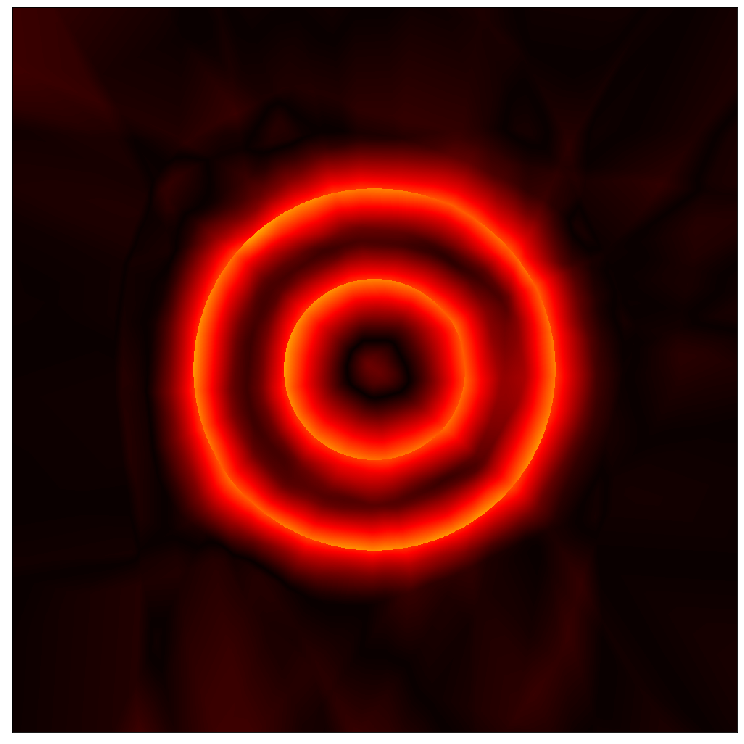

In [26]:
visualize_error(f_alp_l1_ip0)

visualize range [0.00016967450210358948, 1.1172858476638794] mean 0.24529893696308136


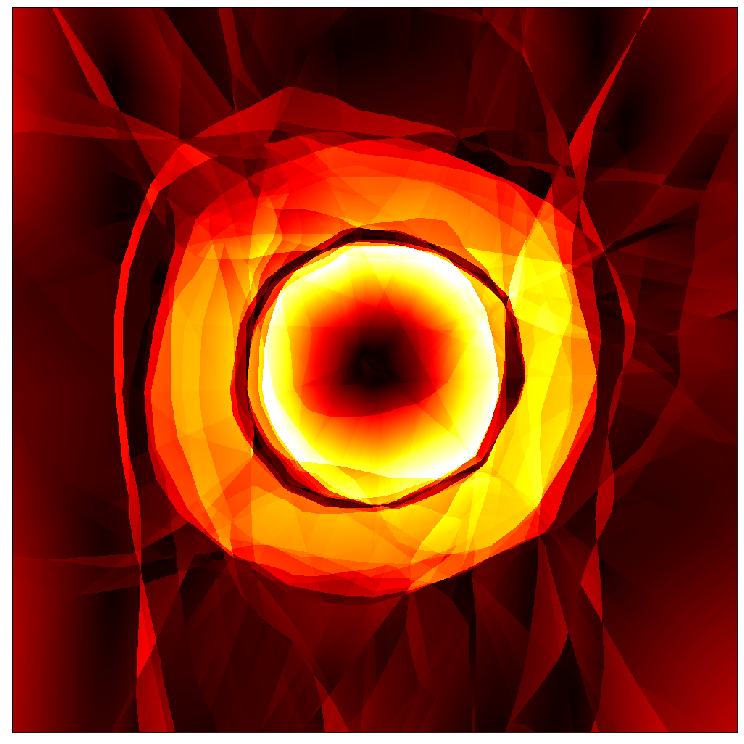

In [27]:
visualize_gradients(f_alp_l1_ip0)

In [28]:
# ALP \lambda 10 ip 0
f_alp_l10_ip0 = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_alp_l10_ip0.parameters())

alr = ALR(
    d_X=lambda x, x_hat: torch.norm(x - x_hat, p=2, dim=1, keepdim=True), 
    d_Y=lambda y, y_hat: torch.abs(y - y_hat), 
    eps_min=1e-6, 
    eps_max=1e-5,
    xi=1e-1, 
    ip=0, 
    K=1
)

lambda_alp = 10

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)

    optimizer.zero_grad()
    
    x_hat = alr.get_adversarial_perturbations(
        f=f_alp_l10_ip0, x=x_reg
    )
    
    y_hat = f_alp_l10_ip0(x)
    loss = F.mse_loss(y_hat, y)
    
    alp, lip_ratio, x_diff, y_diff, alp_count = alr.get_alp(
        x=x_reg, x_hat=x_hat, y=f_alp_l10_ip0(x_reg), y_hat=f_alp_l10_ip0(x_hat)
    )
    
    alp_loss = lambda_alp * (alp ** 2).mean()
    
    (loss + alp_loss).backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()} count={alp_count} lip={lip_ratio.max().item()}")
    

visualize range [0.00010528167331358418, 0.9991811513900757] mean 0.21440398693084717


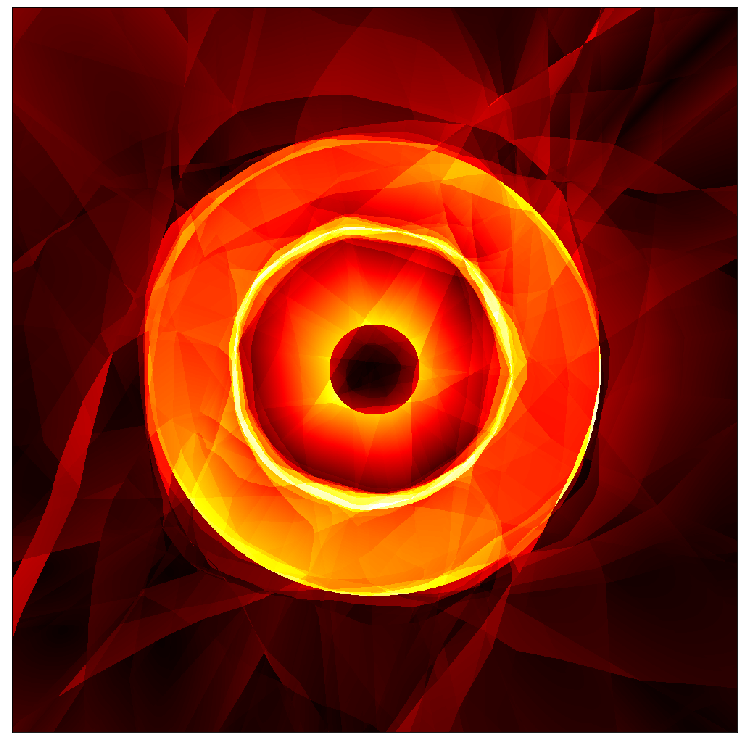

In [29]:
visualize_gradient_error(f_alp_l10_ip0)

visualize range [0.019386649131774902, 1.045875072479248] mean 0.8267190456390381


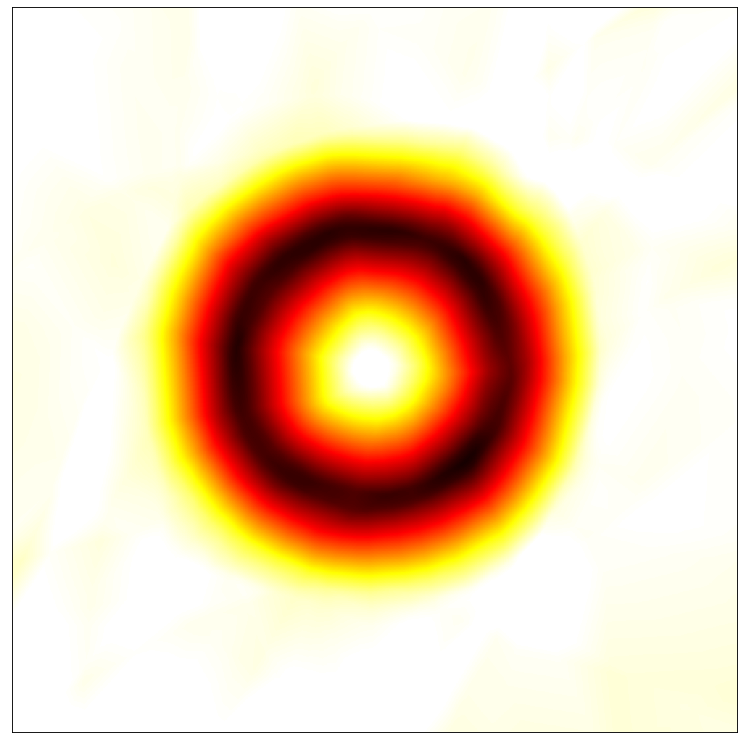

In [30]:
visualize_map(f_alp_l10_ip0)

visualize range [0.0, 0.6464292407035828] mean 0.09763164073228836


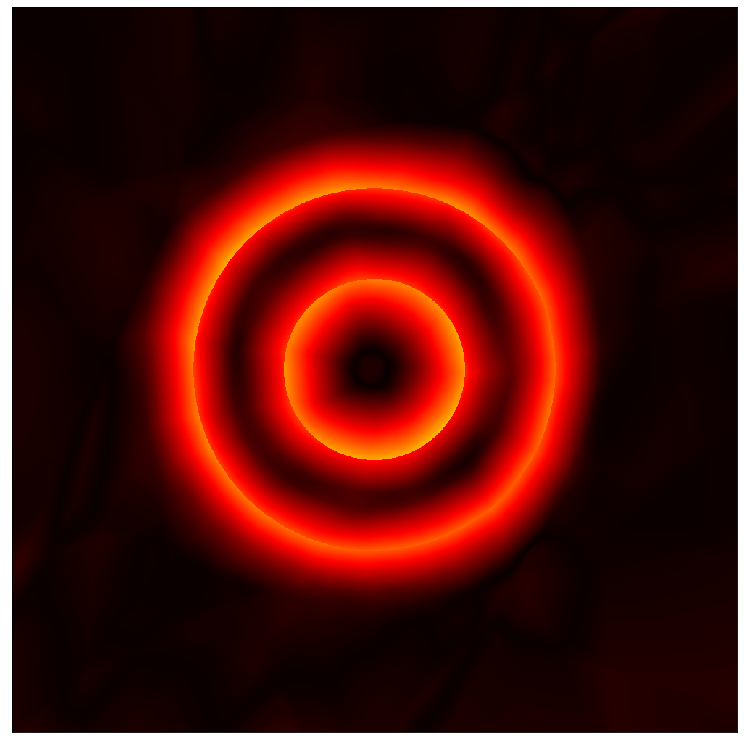

In [31]:
visualize_error(f_alp_l10_ip0)

visualize range [0.00010528167331358418, 0.9113637804985046] mean 0.22493113577365875


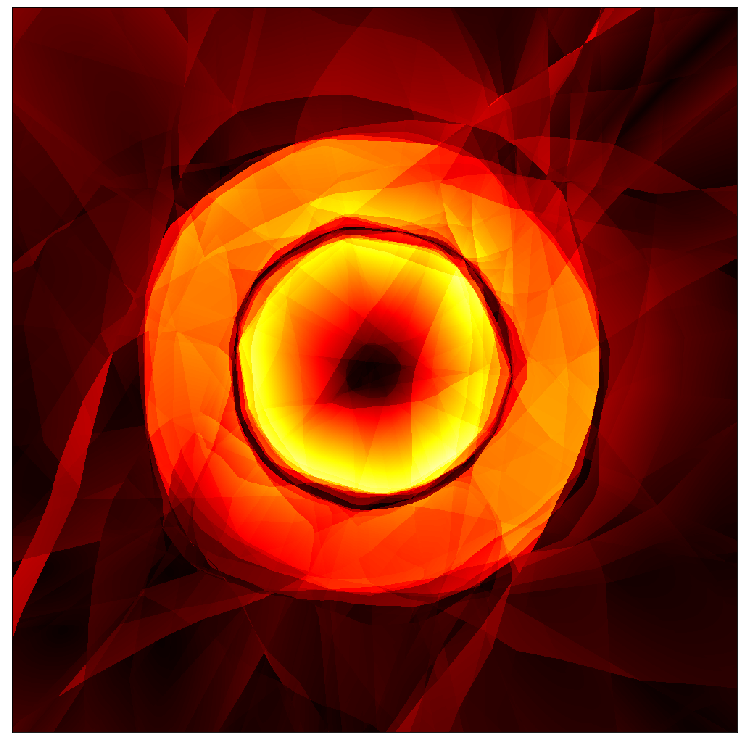

In [32]:
visualize_gradients(f_alp_l10_ip0)

In [33]:
# ALP \lambda 1 ip 1
f_alp_l01_ip1 = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_alp_l01_ip1.parameters())

alr = ALR(
    d_X=lambda x, x_hat: torch.norm(x - x_hat, p=2, dim=1, keepdim=True), 
    d_Y=lambda y, y_hat: torch.abs(y - y_hat), 
    eps_min=1e-6, 
    eps_max=1e-5,
    xi=1e-1, 
    ip=1, 
    K=1
)

lambda_alp = 0.1

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)

    optimizer.zero_grad()
    
    x_hat = alr.get_adversarial_perturbations(
        f=f_alp_l01_ip1, x=x_reg
    )
    
    y_hat = f_alp_l01_ip1(x)
    loss = F.mse_loss(y_hat, y)
    
    alp, lip_ratio, x_diff, y_diff, alp_count = alr.get_alp(
        x=x_reg, x_hat=x_hat, y=f_alp_l01_ip1(x_reg), y_hat=f_alp_l01_ip1(x_hat)
    )
    
    alp_loss = lambda_alp * (alp ** 2).mean()
    
    (loss + alp_loss).backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()} count={alp_count} lip={lip_ratio.max().item()}")
    

visualize range [2.8931650376762263e-05, 0.9994178414344788] mean 0.23577243089675903


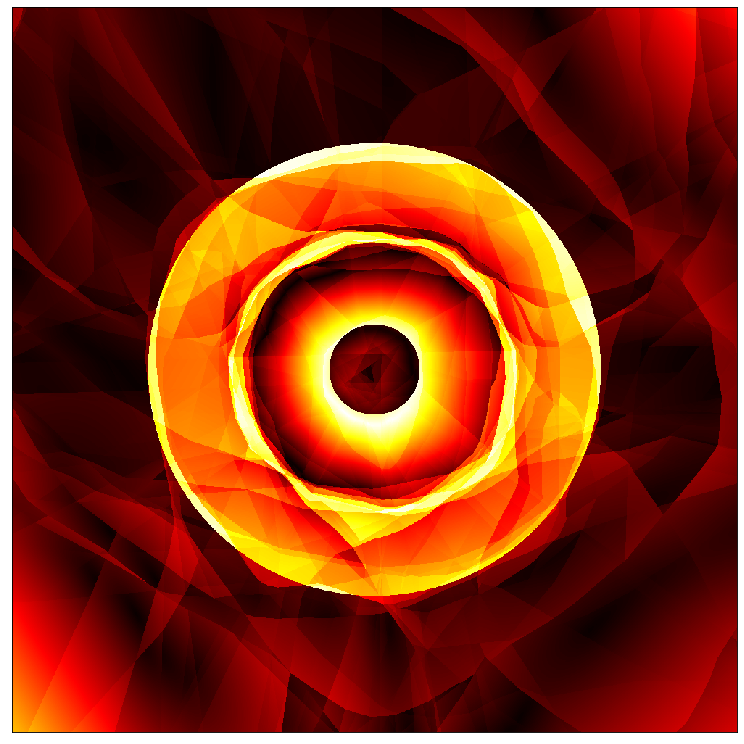

In [34]:
visualize_gradient_error(f_alp_l01_ip1)

visualize range [0.06243008375167847, 1.1633198261260986] mean 0.8585516214370728


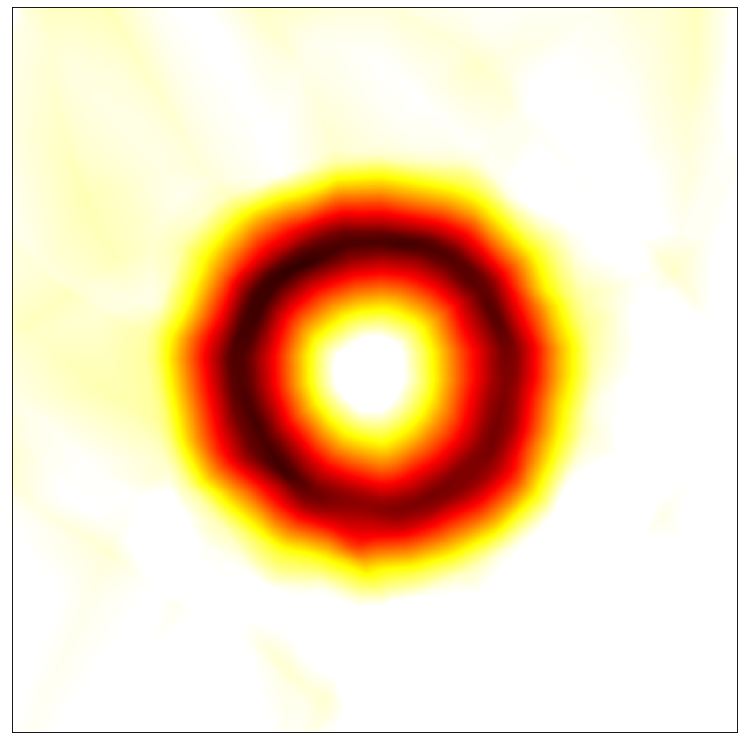

In [35]:
visualize_map(f_alp_l01_ip1)

visualize range [0.0, 0.6426633596420288] mean 0.09967995434999466


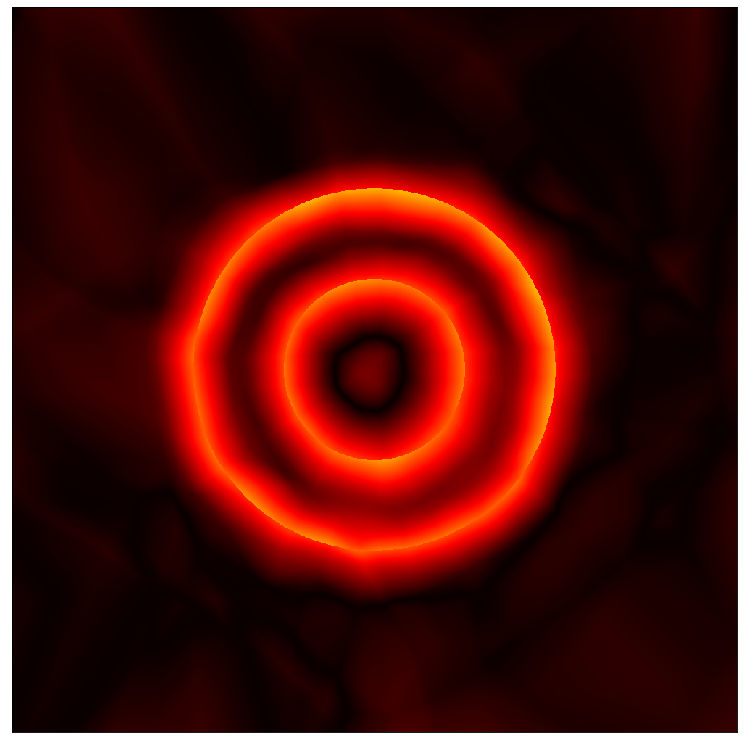

In [36]:
visualize_error(f_alp_l01_ip1)

visualize range [2.8931650376762263e-05, 1.1890660524368286] mean 0.21439996361732483


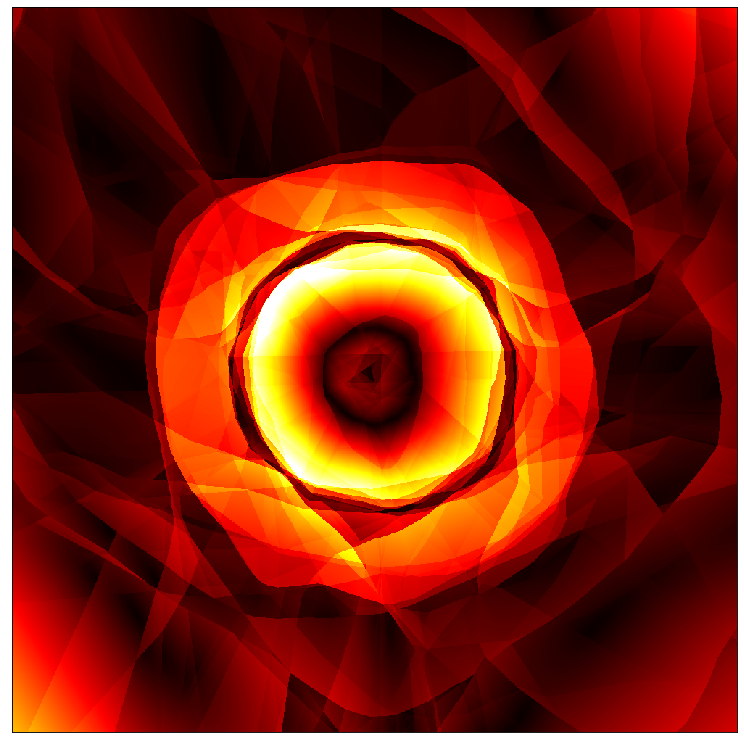

In [37]:
visualize_gradients(f_alp_l01_ip1)

In [38]:
# ALP \lambda 1 ip 1
f_alp_l1_ip1 = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_alp_l1_ip1.parameters())

alr = ALR(
    d_X=lambda x, x_hat: torch.norm(x - x_hat, p=2, dim=1, keepdim=True), 
    d_Y=lambda y, y_hat: torch.abs(y - y_hat), 
    eps_min=1e-6, 
    eps_max=1e-5,
    xi=1e-1, 
    ip=1, 
    K=1
)

lambda_alp = 1

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)

    optimizer.zero_grad()
    
    x_hat = alr.get_adversarial_perturbations(
        f=f_alp_l1_ip1, x=x_reg
    )
    
    y_hat = f_alp_l1_ip1(x)
    loss = F.mse_loss(y_hat, y)
    
    alp, lip_ratio, x_diff, y_diff, alp_count = alr.get_alp(
        x=x_reg, x_hat=x_hat, y=f_alp_l1_ip1(x_reg), y_hat=f_alp_l1_ip1(x_hat)
    )
    
    alp_loss = lambda_alp * (alp ** 2).mean()
    
    (loss + alp_loss).backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()} count={alp_count} lip={lip_ratio.max().item()}")
    

visualize range [9.442264854442328e-05, 0.9961532354354858] mean 0.21847864985466003


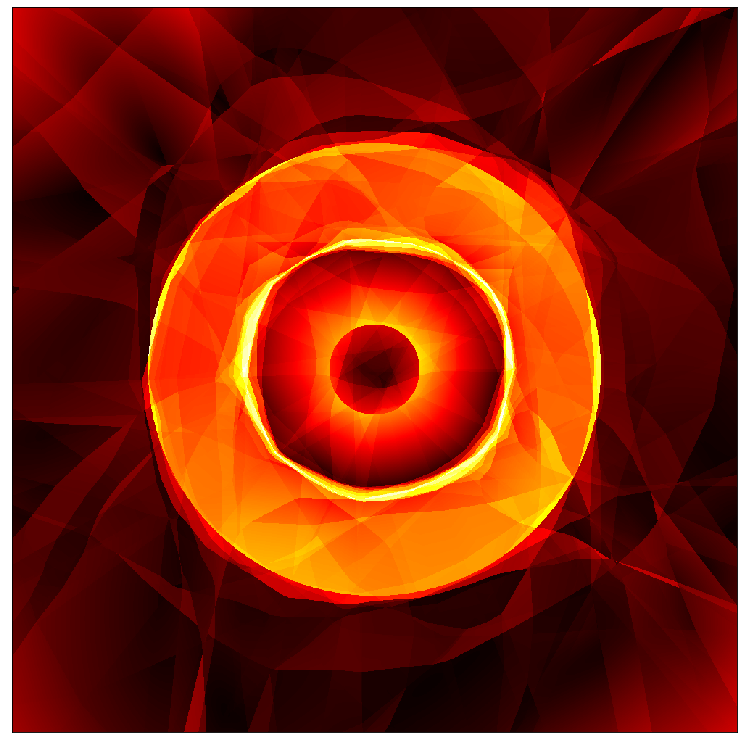

In [39]:
visualize_gradient_error(f_alp_l1_ip1)

visualize range [0.07316091656684875, 1.078203797340393] mean 0.84280925989151


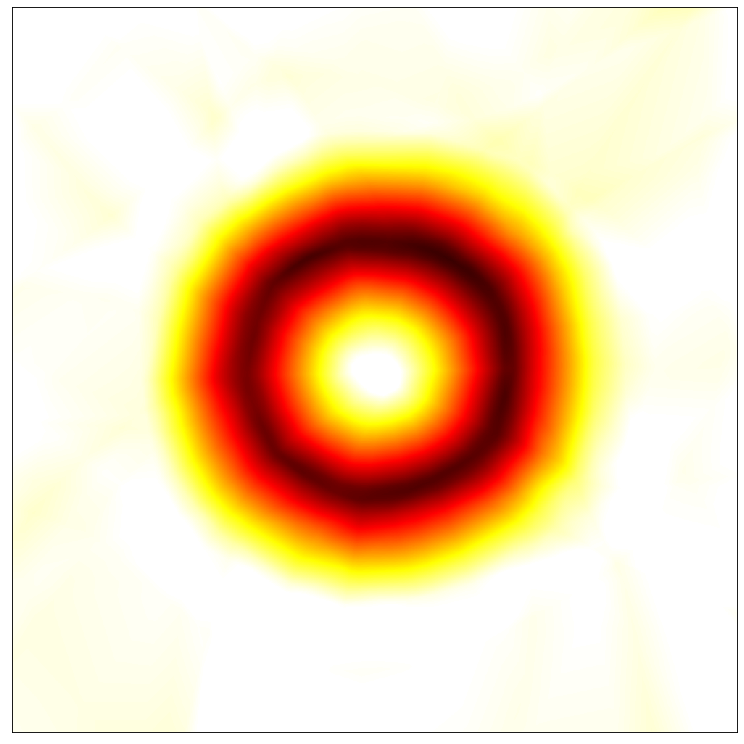

In [40]:
visualize_map(f_alp_l1_ip1)

visualize range [0.0, 0.6045986413955688] mean 0.10238895565271378


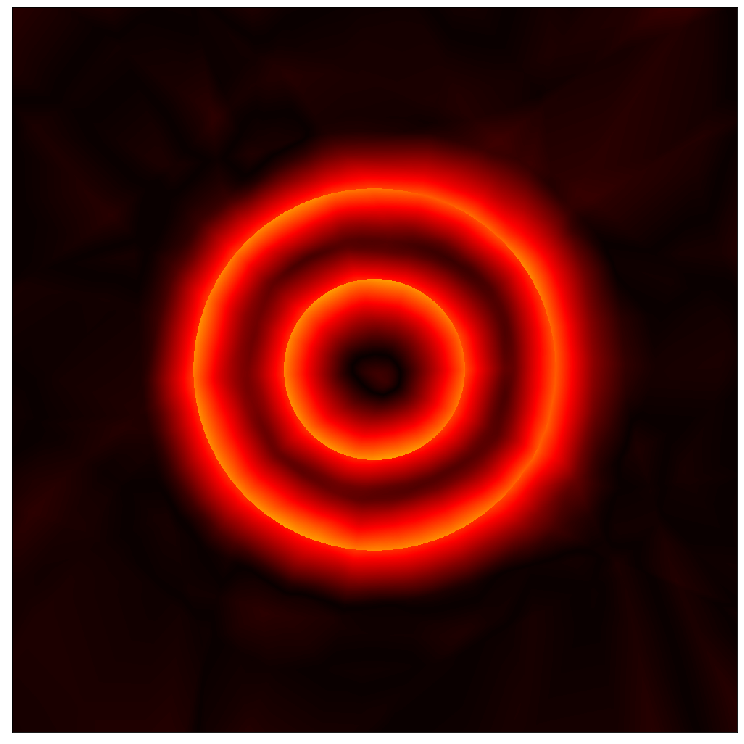

In [41]:
visualize_error(f_alp_l1_ip1)

visualize range [9.442264854442328e-05, 0.9437583088874817] mean 0.22981718182563782


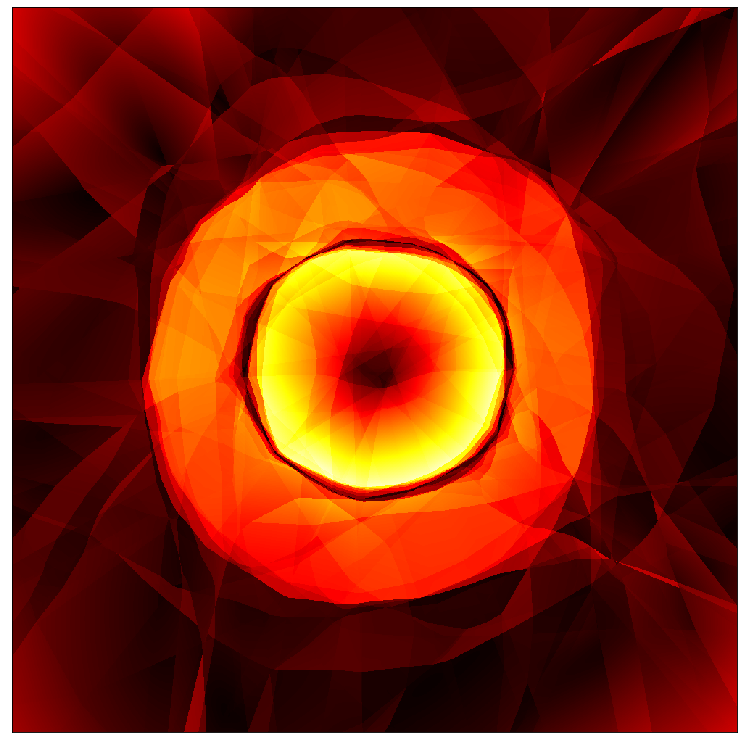

In [42]:
visualize_gradients(f_alp_l1_ip1)

In [43]:
# ALP \lambda 10 ip 1
f_alp_l10_ip1 = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_alp_l10_ip1.parameters())

alr = ALR(
    d_X=lambda x, x_hat: torch.norm(x - x_hat, p=2, dim=1, keepdim=True), 
    d_Y=lambda y, y_hat: torch.abs(y - y_hat), 
    eps_min=1e-6, 
    eps_max=1e-5,
    xi=1e-1, 
    ip=1, 
    K=1
)

lambda_alp = 10

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)

    optimizer.zero_grad()
    
    x_hat = alr.get_adversarial_perturbations(
        f=f_alp_l10_ip1, x=x_reg
    )
    
    y_hat = f_alp_l10_ip1(x)
    loss = F.mse_loss(y_hat, y)
    
    alp, lip_ratio, x_diff, y_diff, alp_count = alr.get_alp(
        x=x_reg, x_hat=x_hat, y=f_alp_l10_ip1(x_reg), y_hat=f_alp_l10_ip1(x_hat)
    )
    
    alp_loss = lambda_alp * (alp ** 2).mean()
    
    (loss + alp_loss).backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()} count={alp_count} lip={lip_ratio.max().item()}")
    

visualize range [0.0004189206811133772, 0.9992765784263611] mean 0.24365730583667755


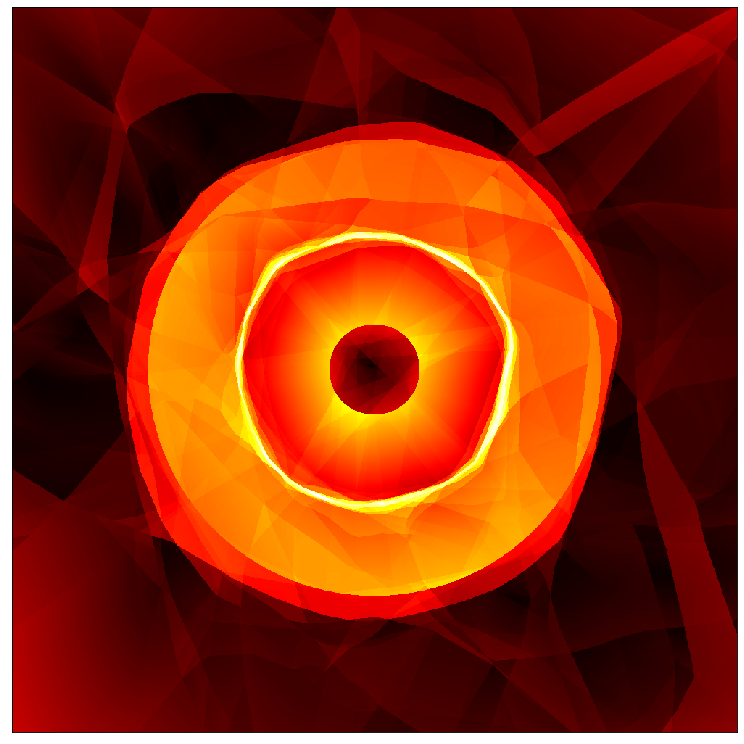

In [44]:
visualize_gradient_error(f_alp_l10_ip1)

visualize range [0.18217171728610992, 1.0628533363342285] mean 0.8421064019203186


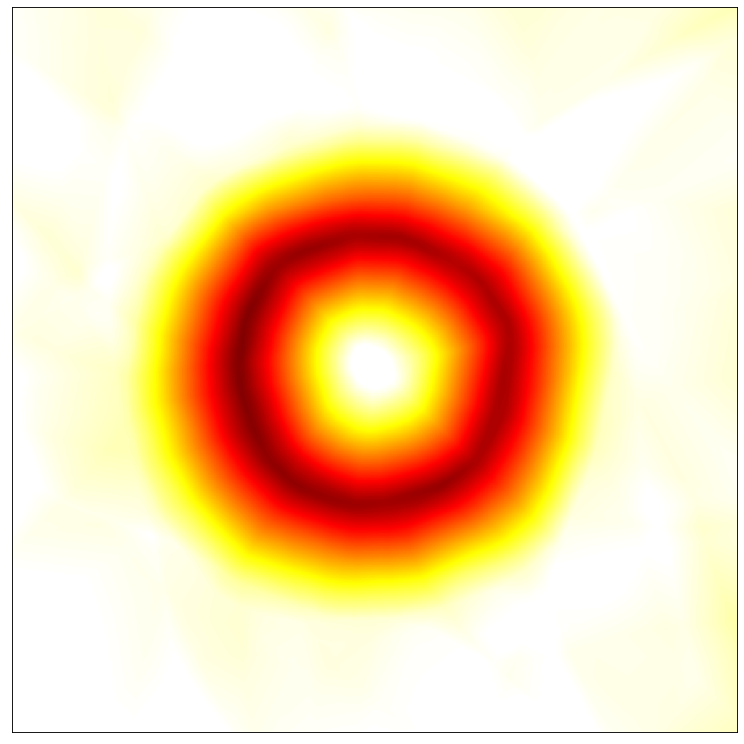

In [45]:
visualize_map(f_alp_l10_ip1)

visualize range [0.0, 0.57555091381073] mean 0.11888615041971207


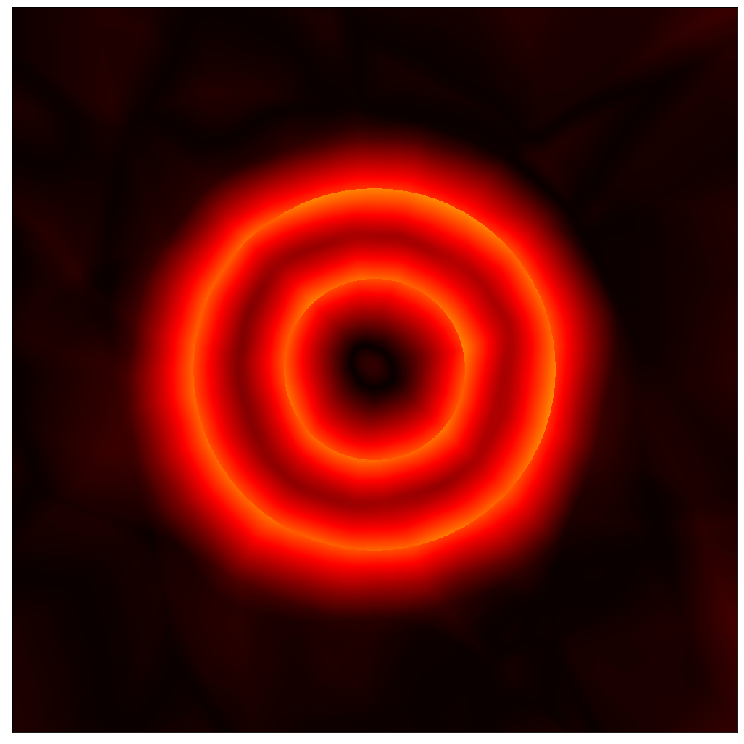

In [46]:
visualize_error(f_alp_l10_ip1)

visualize range [0.0004189206811133772, 0.7118752598762512] mean 0.2235870063304901


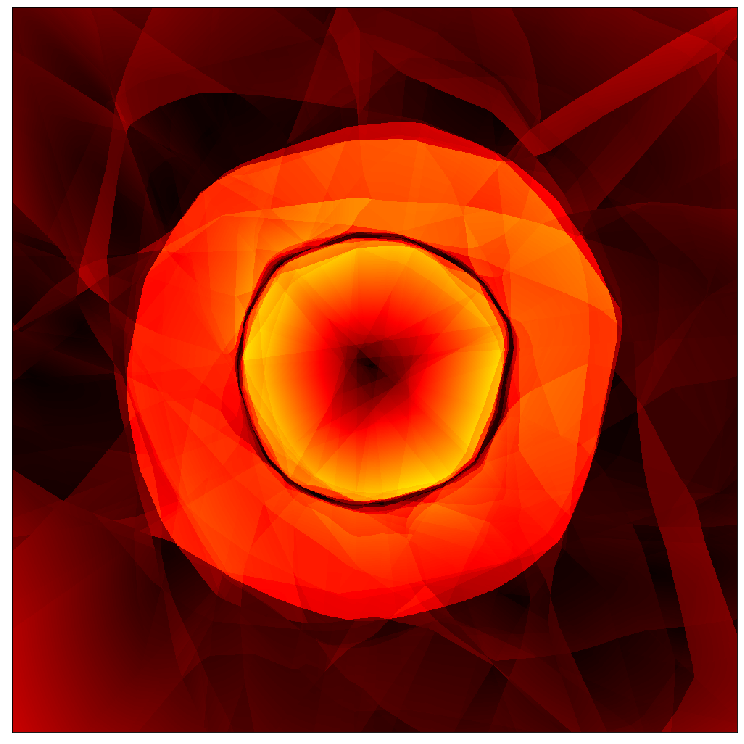

In [47]:
visualize_gradients(f_alp_l10_ip1)

In [48]:
# ALP \lambda 0.1 ip 5
f_alp_l01_ip5 = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_alp_l01_ip5.parameters())

alr = ALR(
    d_X=lambda x, x_hat: torch.norm(x - x_hat, p=2, dim=1, keepdim=True), 
    d_Y=lambda y, y_hat: torch.abs(y - y_hat), 
    eps_min=1e-6, 
    eps_max=1e-5,
    xi=1e-1, 
    ip=5, 
    K=1
)

lambda_alp = 0.1

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)

    optimizer.zero_grad()
    
    x_hat = alr.get_adversarial_perturbations(
        f=f_alp_l01_ip5, x=x_reg
    )
    
    y_hat = f_alp_l01_ip5(x)
    loss = F.mse_loss(y_hat, y)
    
    alp, lip_ratio, x_diff, y_diff, alp_count = alr.get_alp(
        x=x_reg, x_hat=x_hat, y=f_alp_l01_ip5(x_reg), y_hat=f_alp_l01_ip5(x_hat)
    )
    
    alp_loss = lambda_alp * (alp ** 2).mean()
    
    (loss + alp_loss).backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()} count={alp_count} lip={lip_ratio.max().item()}")
    

visualize range [2.384185791015625e-06, 0.9872182607650757] mean 0.1866321861743927


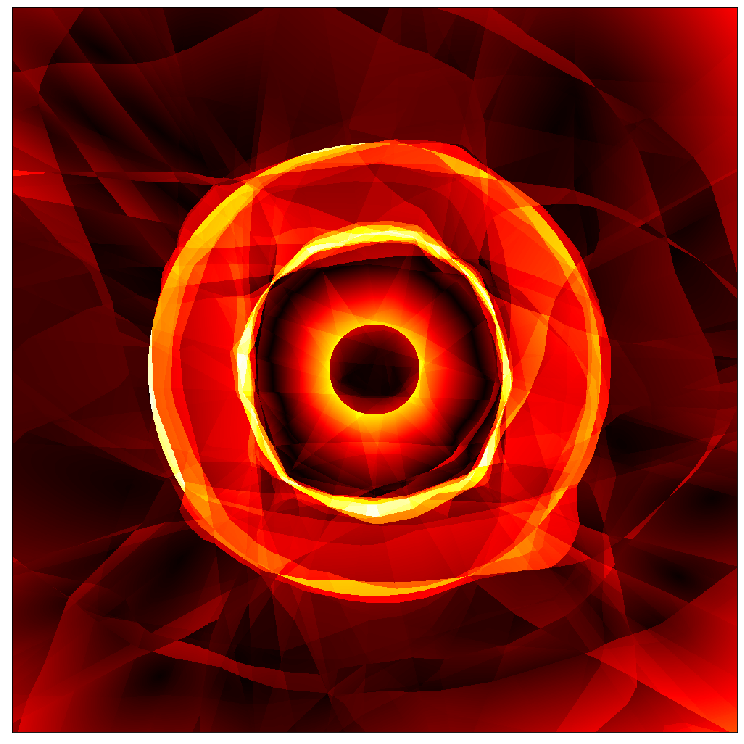

In [49]:
visualize_gradient_error(f_alp_l01_ip5)

visualize range [0.028394728899002075, 1.1561545133590698] mean 0.8599801063537598


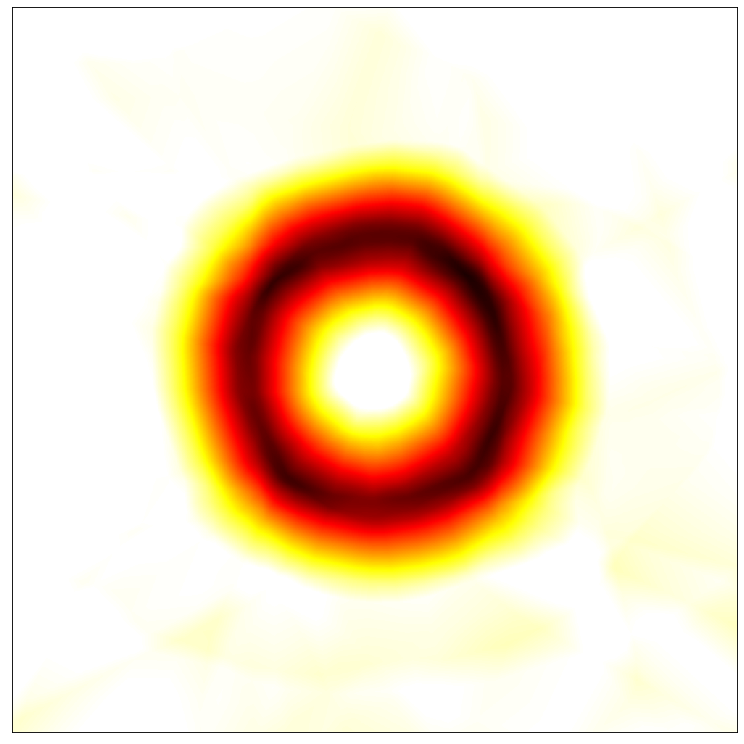

In [50]:
visualize_map(f_alp_l01_ip5)

visualize range [1.1920928955078125e-07, 0.6652461290359497] mean 0.09238956868648529


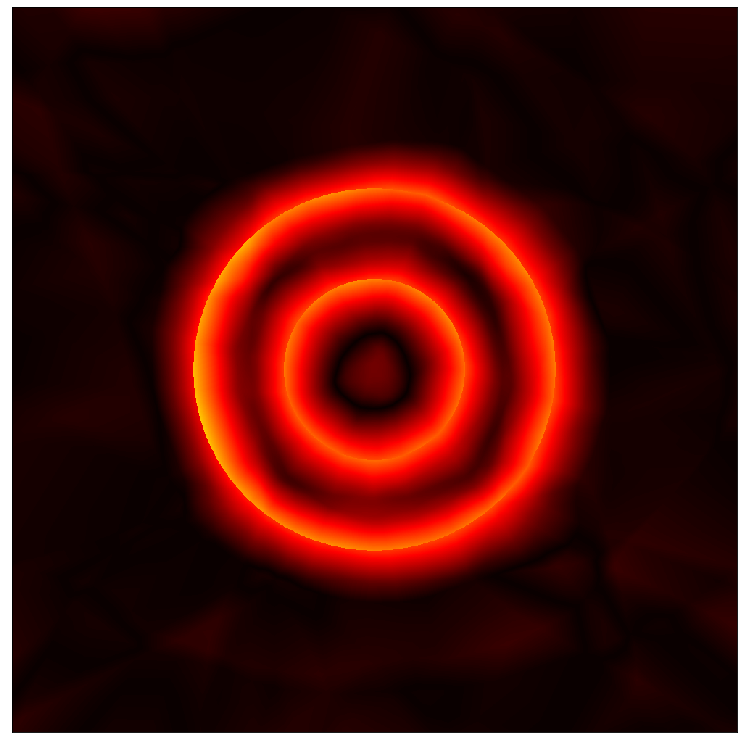

In [51]:
visualize_error(f_alp_l01_ip5)

visualize range [3.1338764529209584e-05, 1.2114741802215576] mean 0.27126508951187134


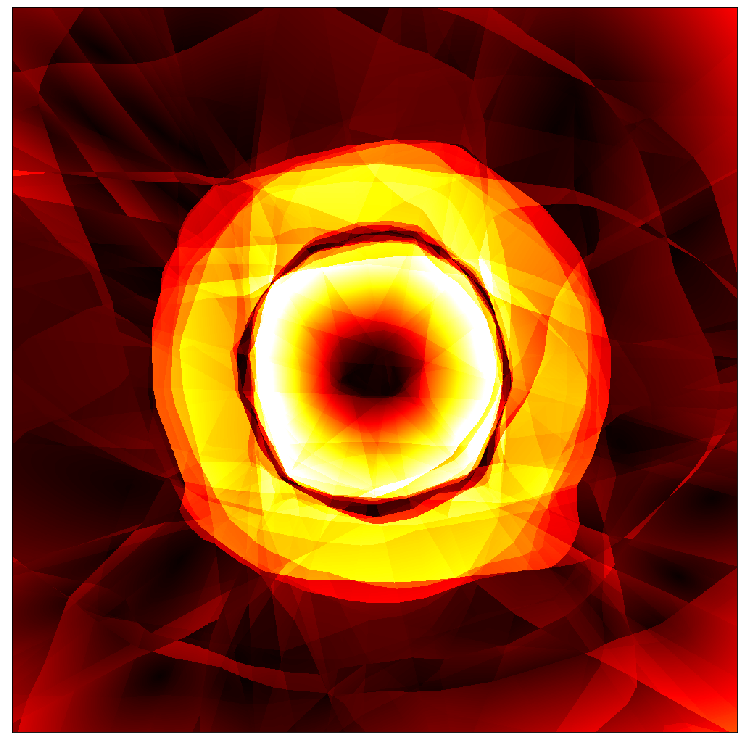

In [52]:
visualize_gradients(f_alp_l01_ip5)

In [53]:
# ALP \lambda 1 ip 5
f_alp_l1_ip5 = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_alp_l1_ip5.parameters())

alr = ALR(
    d_X=lambda x, x_hat: torch.norm(x - x_hat, p=2, dim=1, keepdim=True), 
    d_Y=lambda y, y_hat: torch.abs(y - y_hat), 
    eps_min=1e-6, 
    eps_max=1e-5,
    xi=1e-1, 
    ip=5, 
    K=1
)

lambda_alp = 1

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)

    optimizer.zero_grad()
    
    x_hat = alr.get_adversarial_perturbations(
        f=f_alp_l1_ip5, x=x_reg
    )
    
    y_hat = f_alp_l1_ip5(x)
    loss = F.mse_loss(y_hat, y)
    
    alp, lip_ratio, x_diff, y_diff, alp_count = alr.get_alp(
        x=x_reg, x_hat=x_hat, y=f_alp_l1_ip5(x_reg), y_hat=f_alp_l1_ip5(x_hat)
    )
    
    alp_loss = lambda_alp * (alp ** 2).mean()
    
    (loss + alp_loss).backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()} count={alp_count} lip={lip_ratio.max().item()}")
    

visualize range [0.00017163016309496015, 0.996735155582428] mean 0.22780945897102356


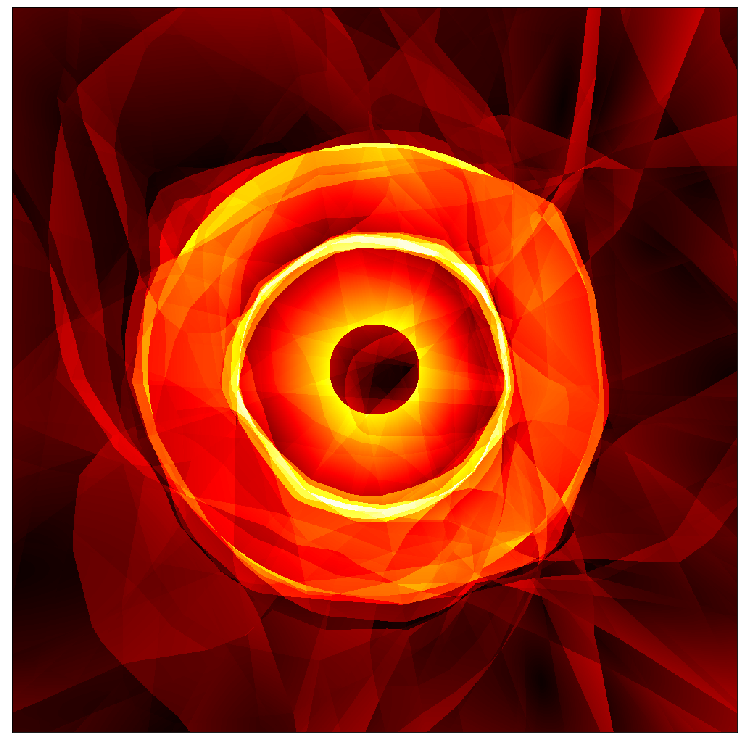

In [54]:
visualize_gradient_error(f_alp_l1_ip5)

visualize range [0.03378266096115112, 1.0800962448120117] mean 0.8382092714309692


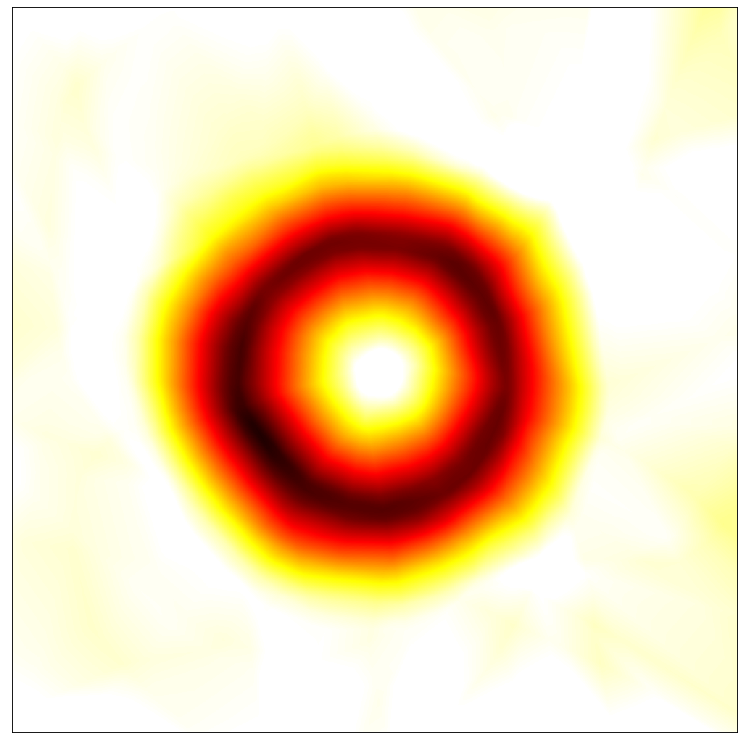

In [55]:
visualize_map(f_alp_l1_ip5)

visualize range [5.960464477539063e-08, 0.60670006275177] mean 0.10607432574033737


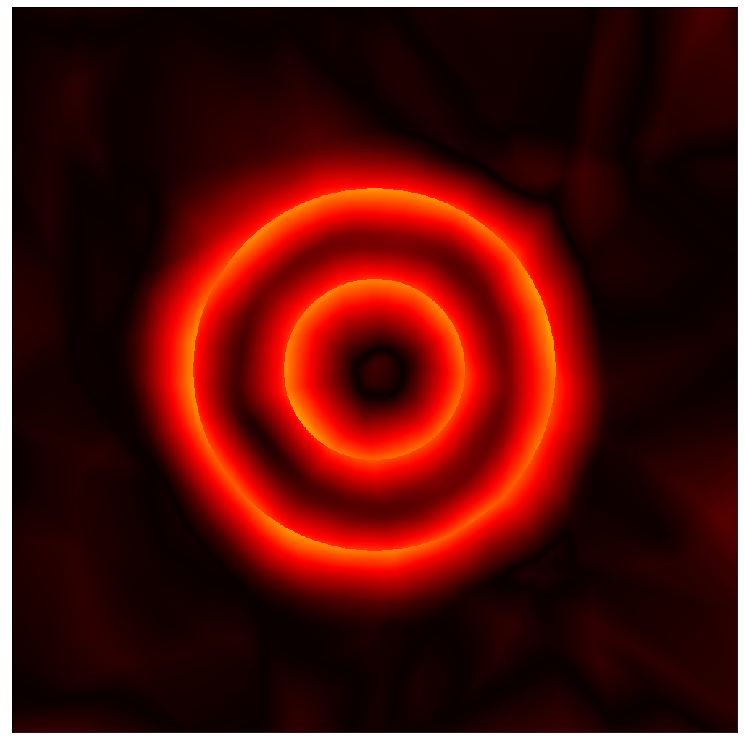

In [56]:
visualize_error(f_alp_l1_ip5)

visualize range [0.00017163016309496015, 0.8949337601661682] mean 0.24549725651741028


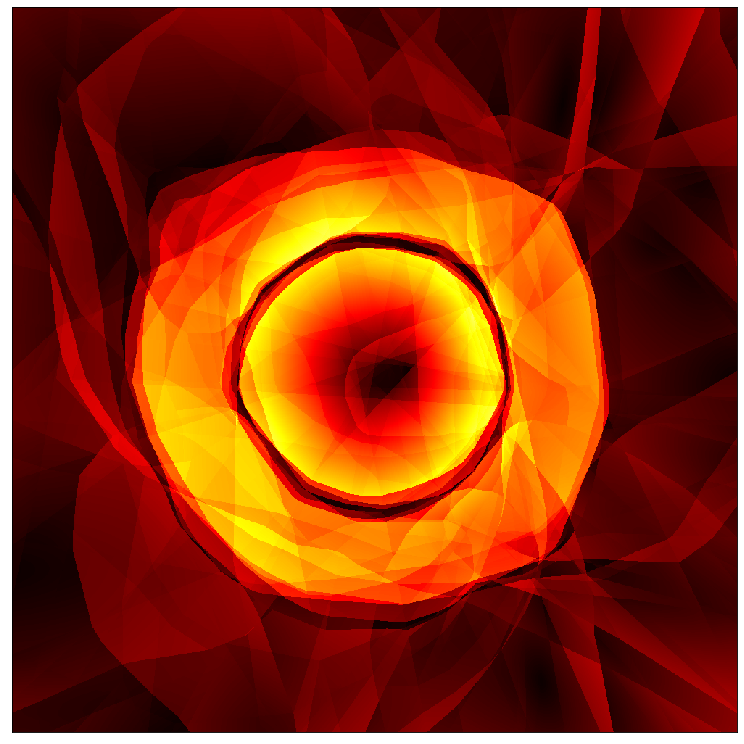

In [57]:
visualize_gradients(f_alp_l1_ip5)

In [58]:
# ALP \lambda 10 ip 5
f_alp_l10_ip5 = nn.Sequential(
    nn.Linear(2, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 40),
    nn.BatchNorm1d(40),
    nn.ReLU(),
    nn.Linear(40, 20),
    nn.BatchNorm1d(20),
    nn.ReLU(),
    nn.Linear(20, 1)
).cuda()

optimizer = torch.optim.Adam(f_alp_l10_ip5.parameters())

alr = ALR(
    d_X=lambda x, x_hat: torch.norm(x - x_hat, p=2, dim=1, keepdim=True), 
    d_Y=lambda y, y_hat: torch.abs(y - y_hat), 
    eps_min=1e-6, 
    eps_max=1e-5,
    xi=1e-1, 
    ip=5, 
    K=1
)

lambda_alp = 10

t = tqdm(iter(dataloader))
for step, batch in enumerate(t):
    x, y, x_reg = upload(batch[0]), upload(batch[1]), upload(batch[2]).view(-1, 2)

    optimizer.zero_grad()
    
    x_hat = alr.get_adversarial_perturbations(
        f=f_alp_l10_ip5, x=x_reg
    )
    
    y_hat = f_alp_l10_ip5(x)
    loss = F.mse_loss(y_hat, y)
    
    alp, lip_ratio, x_diff, y_diff, alp_count = alr.get_alp(
        x=x_reg, x_hat=x_hat, y=f_alp_l10_ip5(x_reg), y_hat=f_alp_l10_ip5(x_hat)
    )
    
    alp_loss = lambda_alp * (alp ** 2).mean()
    
    (loss + alp_loss).backward()
    optimizer.step()
    t.set_description(f"loss={loss.item()} count={alp_count} lip={lip_ratio.max().item()}")
    

visualize range [0.00014393516175914556, 0.9989210963249207] mean 0.2601754665374756


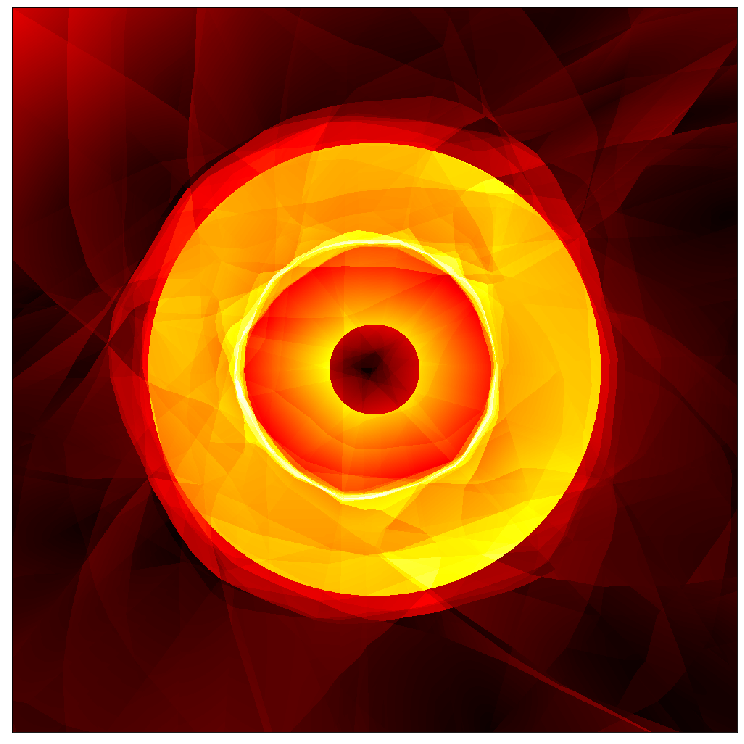

In [59]:
visualize_gradient_error(f_alp_l10_ip5)

visualize range [0.22566063702106476, 1.044739007949829] mean 0.8645023107528687


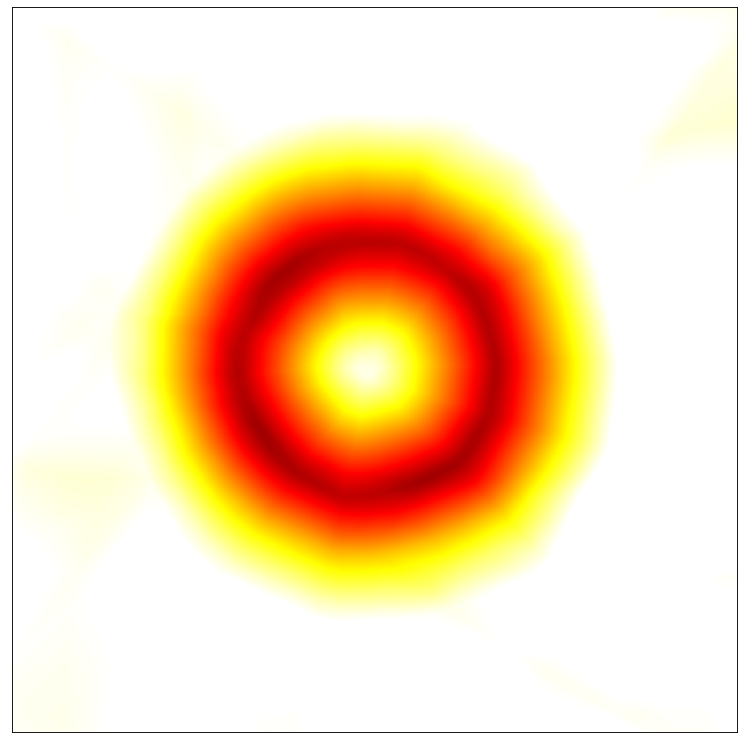

In [60]:
visualize_map(f_alp_l10_ip5)

visualize range [5.960464477539063e-08, 0.6517136096954346] mean 0.11654918640851974


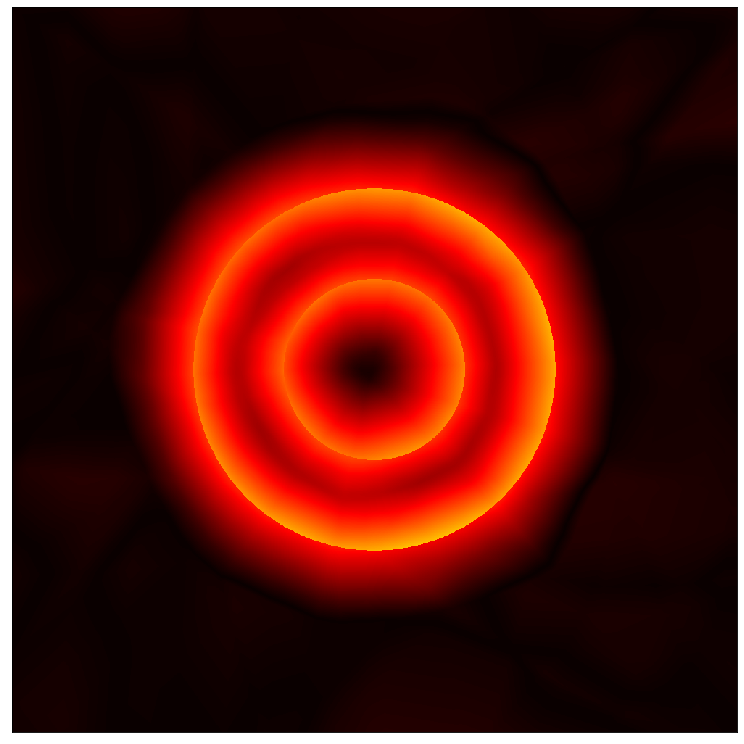

In [61]:
visualize_error(f_alp_l10_ip5)

visualize range [0.00014393516175914556, 0.6772616505622864] mean 0.19281674921512604


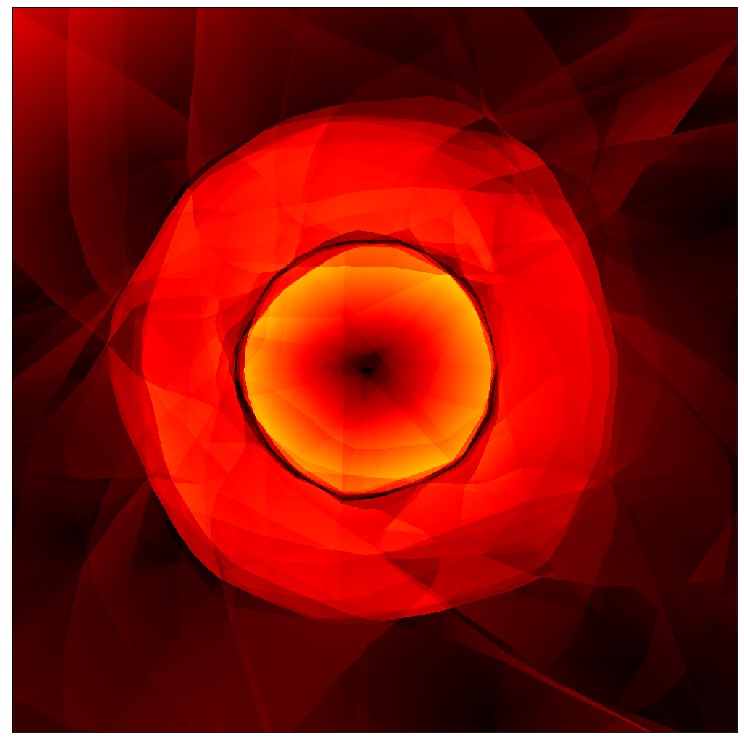

In [62]:
visualize_gradients(f_alp_l10_ip5)